# Final Assignment — FinTech Course
## Credit Card Customer Attrition Prediction


This is a binary classification problem:

Class 1 — Attrited Customer : the client closed the account.

Class 0 — Existing Customer : the client kept the account.

1 apply Lasso regression to reduce the number of features, and apply a random forest classifier
to the reduced dataset, choosing the optimal hyperparameters.

2 compare the results in terms of prediction with a random forest classifier on the whole set of
original features, choosing the optimal hyperparameters.

3 compare the best model with a XGBoost classifier

## Imports


In [1]:
pip install pandas numpy matplotlib seaborn scikit-learn xgboost shap openpyxl


[notice] A new release of pip is available: 26.0 -> 26.1.2
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import openpyxl
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report,
    roc_auc_score, roc_curve, auc,
    average_precision_score, precision_recall_curve,
    ConfusionMatrixDisplay,
)
import xgboost as xgb
import shap
import warnings
warnings.filterwarnings('ignore')

/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Reproducibility
SEED = 42
np.random.seed(SEED)

# Exploratory Data Analysis

## Load the dataset

In [4]:
df = pd.read_excel('Dataset1.xlsx')
print('Shape:', df.shape)
df.head()

Shape: (10127, 21)


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


## First look at the data

I check the column types and a quick statistical summary.

In [5]:
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  str    
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  str    
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  str    
 6   Marital_Status            10127 non-null  str    
 7   Income_Category           10127 non-null  str    
 8   Card_Category             10127 non-null  str    
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_Revolving_B

In [6]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,NaN,NaN,NaN,739177606.333663,36903783.450231,708082083.0,713036770.5,717926358.0,773143533.0,828343083.0
Attrition_Flag,10127,2,Existing Customer,8500,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Customer_Age,10127.0,NaN,NaN,NaN,46.32596,8.016814,26.0,41.0,46.0,52.0,73.0
Gender,10127,2,F,5358,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependent_count,10127.0,NaN,NaN,NaN,2.346203,1.298908,0.0,1.0,2.0,3.0,5.0
Education_Level,10127,7,Graduate,3128,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Marital_Status,10127,4,Married,4687,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Income_Category,10127,6,Less than $40K,3561,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Card_Category,10127,4,Blue,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Months_on_book,10127.0,NaN,NaN,NaN,35.928409,7.986416,13.0,31.0,36.0,40.0,56.0


## Missing values

I check whether any column has missing entries.

In [7]:
df.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

## Drop the ID column

CLIENTNUM is just a unique customer identifier. It carries no predictive information, so I remove it.

In [8]:
df = df.drop(columns=['CLIENTNUM'])

## Target variable

The target is Attrition_Flag. I look at the class balance.

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

Attrition_Flag
Existing Customer    83.93 %
Attrited Customer    16.07 %
Name: proportion, dtype: str


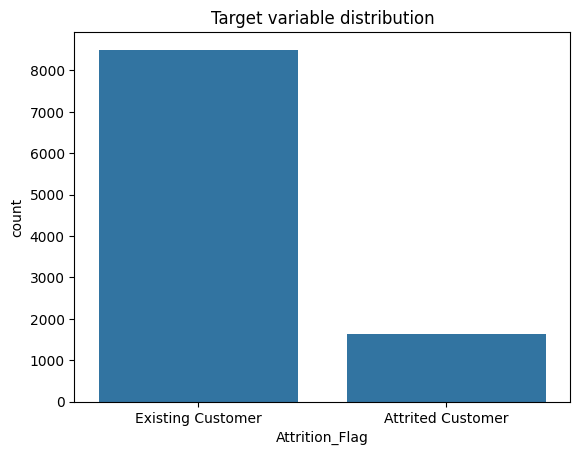

In [9]:
target_counts = df['Attrition_Flag'].value_counts()
target_pct = df['Attrition_Flag'].value_counts(normalize=True) * 100

print(target_counts)
print()
print(target_pct.round(2).astype(str) + ' %')

sns.countplot(x='Attrition_Flag', data=df)
plt.title('Target variable distribution')
plt.show()

The dataset is imbalanced : about 84% of customers stayed and only 16% churned.

## Split features into numeric and categorical

In [10]:
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = df.select_dtypes(include='object').columns.tolist()
categorical_cols.remove('Attrition_Flag')  # target is categorical but we treat it apart

print('Numeric features    :', numeric_cols)
print('Categorical features:', categorical_cols)

Numeric features    : ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']
Categorical features: ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']


## Numeric features

I plot the distribution of each numeric feature and compare it across the two classes (Existing vs Attrited) using boxplots. This helps to see which features may be useful to separate the two groups.

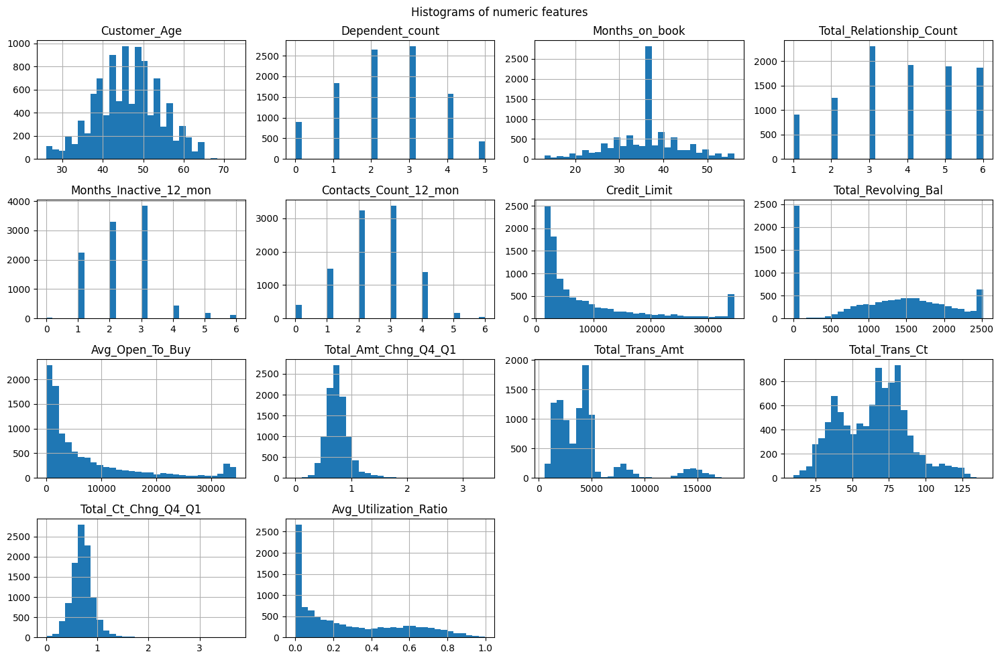

In [11]:
# Histograms
df[numeric_cols].hist(bins=30, figsize=(15, 10))
plt.suptitle('Histograms of numeric features')
plt.tight_layout()
plt.show()

Several features are right skewed: Credit_Limit, Avg_Open_To_Buy, Total_Trans_Amt. Customer_Age is roughly bell shaped around 46. Total_Revolving_Bal and Avg_Utilization_Ratio show a large spike at zero, meaning many customers pay in full and never carry a balance. Months_on_book has an unusual peak at 36 months, probably an anniversary or default contract length.

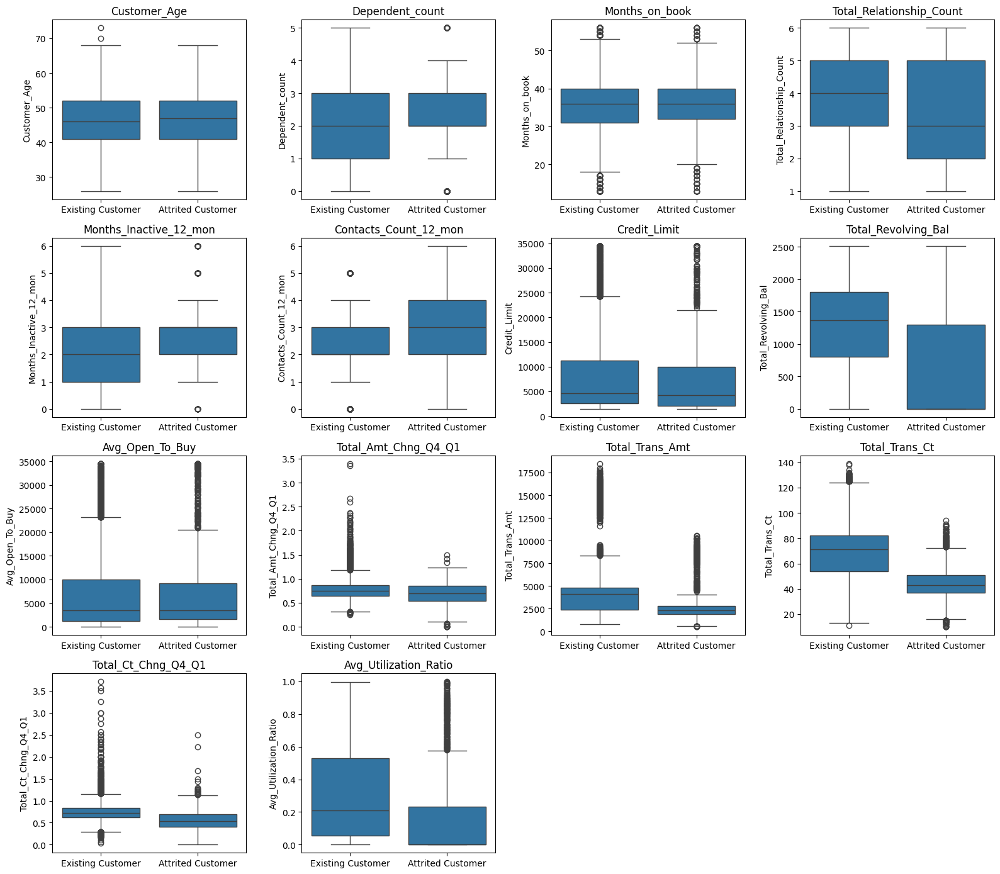

In [12]:
# Boxplots by target
fig, axes = plt.subplots(4, 4, figsize=(16, 14))
for ax, col in zip(axes.flat, numeric_cols):
    sns.boxplot(x='Attrition_Flag', y=col, data=df, ax=ax)
    ax.set_title(col)
    ax.set_xlabel('')
for ax in axes.flat[len(numeric_cols):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()

A few features clearly separate the two classes. Attrited customers transact much less (Total_Trans_Ct mean 45 vs 70), carry far less revolving balance (drop of around 50%), use less of their credit (Avg_Utilization_Ratio drops by around 50%), see their activity drop between Q1 and Q4 (mean 0.5 vs 0.7), contact the bank more often (Contacts_Count_12_mon mean 3 vs 2.5), and hold fewer products (Total_Relationship_Count drops from 4 to 3).

By contrast, demographic features (Customer_Age, Dependent_count, Months_on_book) show almost no difference between the two groups.

## Categorical features

For each categorical feature I look at the proportion of attrited customers in every category.

In [13]:
for col in categorical_cols:
    print(col, '->', df[col].unique())

Gender -> <StringArray>
['M', 'F']
Length: 2, dtype: str
Education_Level -> <StringArray>
[  'High School',      'Graduate',    'Uneducated',       'Unknown',
       'College', 'Post-Graduate',     'Doctorate']
Length: 7, dtype: str
Marital_Status -> <StringArray>
['Married', 'Single', 'Unknown', 'Divorced']
Length: 4, dtype: str
Income_Category -> <StringArray>
[   '$60K - $80K', 'Less than $40K',   '$80K - $120K',    '$40K - $60K',
        '$120K +',        'Unknown']
Length: 6, dtype: str
Card_Category -> <StringArray>
['Blue', 'Gold', 'Silver', 'Platinum']
Length: 4, dtype: str


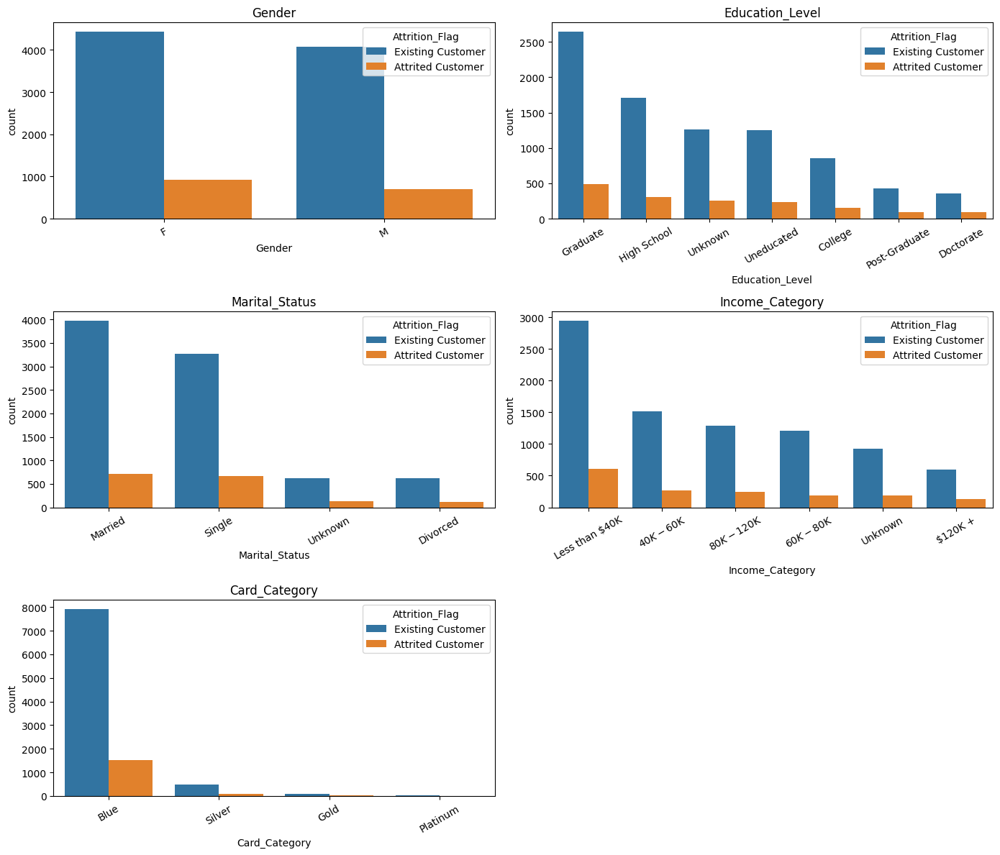

In [14]:
fig, axes = plt.subplots(3, 2, figsize=(14, 12))
for ax, col in zip(axes.flat, categorical_cols):
    sns.countplot(x=col, hue='Attrition_Flag', data=df, ax=ax,
                  order=df[col].value_counts().index)
    ax.set_title(col)
    ax.tick_params(axis='x', rotation=30)
for ax in axes.flat[len(categorical_cols):]:
    ax.set_visible(False)
plt.tight_layout()
plt.show()

In [15]:
# Count and churn rate per category
for col in categorical_cols:
    ct = pd.crosstab(df[col], df['Attrition_Flag'])
    ct['churn_%'] = (ct['Attrited Customer'] / (ct['Attrited Customer'] + ct['Existing Customer']) * 100).round(2)
    print(col)
    print(ct.sort_values('churn_%', ascending=False))
    print()

Gender
Attrition_Flag  Attrited Customer  Existing Customer  churn_%
Gender                                                       
F                             930               4428    17.36
M                             697               4072    14.62

Education_Level
Attrition_Flag   Attrited Customer  Existing Customer  churn_%
Education_Level                                               
Doctorate                       95                356    21.06
Post-Graduate                   92                424    17.83
Unknown                        256               1263    16.85
Uneducated                     237               1250    15.94
Graduate                       487               2641    15.57
College                        154                859    15.20
High School                    306               1707    15.20

Marital_Status
Attrition_Flag  Attrited Customer  Existing Customer  churn_%
Marital_Status                                               
Unknown              

The categorical features are dominated by one or two large categories. Card_Category is overwhelmingly Blue. Gold has only 116 customers and Platinum just 20. Education_Level is led by Graduate, and Income_Category by Less than 40K.

Looking at the proportion of attrited customers in each category. Gender shows a small but consistent gap (F at 17% versus M at 15%). Education_Level is mostly flat between 15% and 17%, except Doctorate at 21% (95 attrited out of 451 customers, so the rate is real even if the absolute number on the plot looks small). Marital_Status stays between 15% and 17% with no clear pattern. Income_Category ranges from 13% to 17% with no monotonic trend across income brackets. Card_Category shows Platinum at 25%, but with only 20 customers in that category the estimate is not reliable. The difference between Blue, Silver, and Gold is small.

None of these categorical features looks as strong as the behavioral ones identified above, but Gender and Education still carry some signal and are worth keeping as inputs.

## Correlation matrix of numeric features

I check correlations between numeric features.

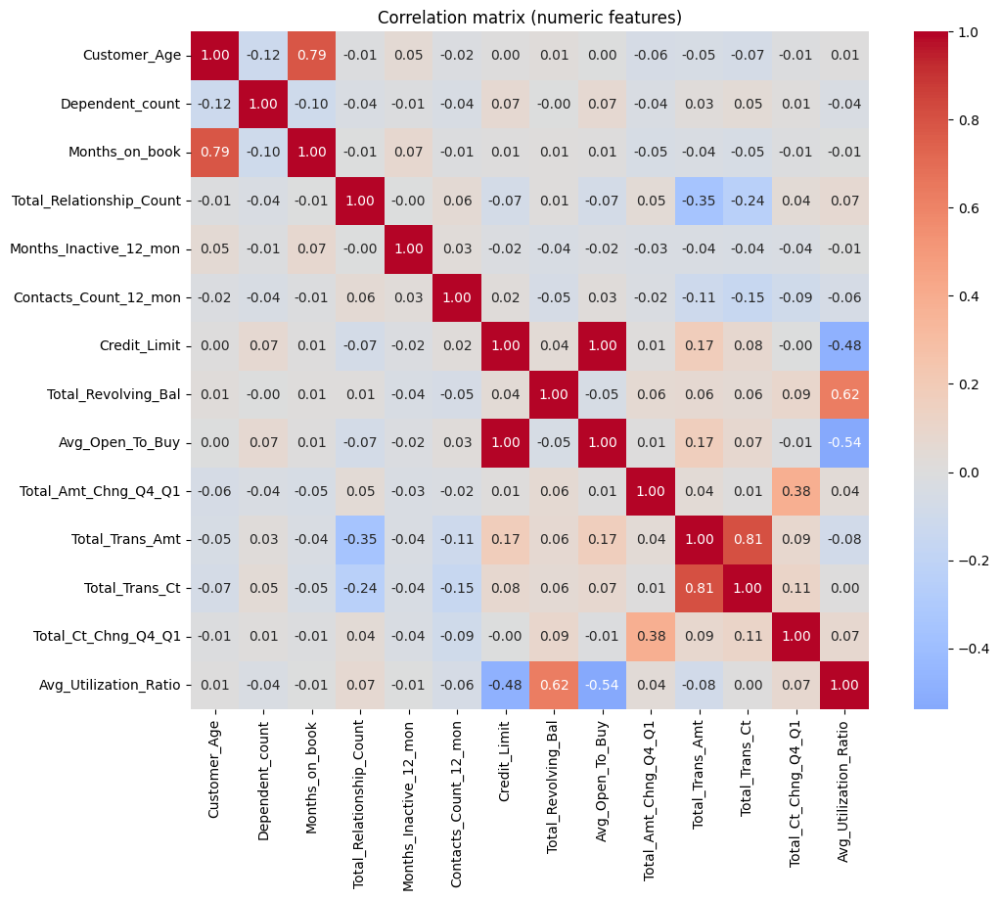

In [16]:
plt.figure(figsize=(12, 9))
sns.heatmap(df[numeric_cols].corr(), annot=True, fmt='.2f', cmap='coolwarm',
            center=0, square=True)
plt.title('Correlation matrix (numeric features)')
plt.show()

Several pairs of features are strongly correlated. Credit_Limit and Avg_Open_To_Buy have a correlation of 1, meaning they carry the same information. Total_Trans_Amt and Total_Trans_Ct are at 0.81, Customer_Age and Months_on_book at 0.79, and Total_Revolving_Bal and Avg_Utilization_Ratio at 0.62.

## EDA Recap

The dataset has 10,127 rows and 20 columns after dropping CLIENTNUM, with no missing values.

Target : the variable is binary and imbalanced (84% Existing, 16% Attrited). This will guide the choice of metrics (AUPR, recall) and the use of class_weight='balanced' in the models.

Strong predictors expected : transaction behavior (Total_Trans_Ct, Total_Trans_Amt, Total_Ct_Chng_Q4_Q1), credit usage (Total_Revolving_Bal, Avg_Utilization_Ratio), and bank engagement (Total_Relationship_Count, Contacts_Count_12_mon) all show clear gaps between the two classes.

Weak predictors expected : most demographic features (Customer_Age, Dependent_count, Months_on_book, Credit_Limit, Avg_Open_To_Buy) show almost no difference between the two classes.

Categorical features : carry only a moderate signal, but Gender and Education_Level keep some predictive value.

Redundant features : credit_Limit and Avg_Open_To_Buy are almost identical, and several other pairs are highly correlated. Lasso should help.

# Data Preparation

In this step I encode the target and the categorical features so that the entire dataset becomes numeric. The split into train, validation and test sets and the standardization are done in the next step, after the split, to avoid data leakage.

## Encode the target

The target Attrition_Flag is mapped to 1 for an attrited customer and 0 for an existing customer.

In [17]:
df['Attrition_Flag'] = (df['Attrition_Flag'] == 'Attrited Customer').astype(int)
df['Attrition_Flag'].value_counts()

Attrition_Flag
0    8500
1    1627
Name: count, dtype: int64

## Encode the categorical features

I use one-hot encoding for all five categorical features (Gender, Education_Level, Marital_Status, Income_Category, Card_Category) with pd.get_dummies.

One-hot encoding treats every category as a separate column, so Unknown is naturally kept as its own category without forcing any numeric order.

In [18]:
df_enc = pd.get_dummies(df, columns=categorical_cols, drop_first=True, dtype=int)
print('Shape after encoding:', df_enc.shape)
df_enc.head()

Shape after encoding: (10127, 33)


,Attrition_Flag,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,Marital_Status_Single,Marital_Status_Unknown,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,45,3,39,5,1,3,12691.0,777,11914.0,...,0,0,0,1,0,0,0,0,0,0
1,0,49,5,44,6,1,2,8256.0,864,7392.0,...,1,0,0,0,0,1,0,0,0,0
2,0,51,3,36,4,1,0,3418.0,0,3418.0,...,0,0,0,0,1,0,0,0,0,0
3,0,40,4,34,3,4,1,3313.0,2517,796.0,...,0,1,0,0,0,1,0,0,0,0
4,0,40,3,21,5,1,0,4716.0,0,4716.0,...,0,0,0,1,0,0,0,0,0,0


In [19]:
# Quick check on the new column names
df_enc.columns.tolist()

['Attrition_Flag',
 'Customer_Age',
 'Dependent_count',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio',
 'Gender_M',
 'Education_Level_Doctorate',
 'Education_Level_Graduate',
 'Education_Level_High School',
 'Education_Level_Post-Graduate',
 'Education_Level_Uneducated',
 'Education_Level_Unknown',
 'Marital_Status_Married',
 'Marital_Status_Single',
 'Marital_Status_Unknown',
 'Income_Category_$40K - $60K',
 'Income_Category_$60K - $80K',
 'Income_Category_$80K - $120K',
 'Income_Category_Less than $40K',
 'Income_Category_Unknown',
 'Card_Category_Gold',
 'Card_Category_Platinum',
 'Card_Category_Silver']

## Recap of Data Preparation

The dataset is now fully numeric. The 20 original columns become 33 columns after encoding (14 numeric features, 18 one-hot dummies, and the target). I am now ready for the split into train, validation and test sets.

# Train, Validation, Test Split and Standardization

I split the dataset into three sets, keeping the class balance with stratification on the target. Train (70%) is used to fit the models and run cross-validation for hyperparameter tuning. Validation (15%) is used to pick the best model among RF reduced, RF full and XGBoost. Test (15%) is used only at the very end to report the final unbiased score.

I then standardize the features, fitting the scaler on the training set only and applying it to the validation and test sets.

## Separate features and target

In [20]:
X = df_enc.drop(columns=['Attrition_Flag'])
y = df_enc['Attrition_Flag']
print('X:', X.shape)
print('y:', y.shape)

X: (10127, 32)
y: (10127,)


## Stratified 70 / 15 / 15 split

I do the split in two steps. First I hold out 30% of the data, then I cut that 30% into two halves of 15% each.

In [21]:
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.30, stratify=y, random_state=SEED
)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=SEED
)

for name, y_set in [('Train', y_train), ('Val', y_val), ('Test', y_test)]:
    print(f'{name:5s}: n = {len(y_set):5d}, attrited rate = {y_set.mean():.4f}')

Train: n =  7088, attrited rate = 0.1607
Val  : n =  1519, attrited rate = 0.1606
Test : n =  1520, attrited rate = 0.1605


The three sets keep the same 16% attrition rate as the full dataset, which confirms that stratification worked as intended.

## Scaled and raw versions of the features

Lasso requires standardized features so that the L1 penalty applies fairly to all of them. Tree based models (Random Forest, XGBoost) are invariant to feature scaling.

I therefore keep two versions of the features: a raw version for the trees and a scaled version for Lasso. The StandardScaler is fit on X_train only and applied to X_val and X_test, so no information from validation or test leaks into the training process.

In [22]:
# Raw versions for tree-based models (Random Forest, XGBoost)
X_train_raw = X_train.copy()
X_val_raw   = X_val.copy()
X_test_raw  = X_test.copy()

# Scaled versions for Lasso (and any model that needs standardized features)
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_val_scaled = pd.DataFrame(
    scaler.transform(X_val), columns=X_val.columns, index=X_val.index
)
X_test_scaled = pd.DataFrame(
    scaler.transform(X_test), columns=X_test.columns, index=X_test.index
)

print('Train scaled mean :', round(X_train_scaled.values.mean(), 6))
print('Train scaled std  :', round(X_train_scaled.values.std(),  4))

Train scaled mean : 0.0
Train scaled std  : 1.0


## Recap

The dataset is split into 7088 / 1519 / 1520 customers (70 / 15 / 15) with the same 16% attrition rate in each set. The features are standardized using parameters learned on the training set only, so the validation and test sets stay untouched.

# Baseline Models

Before training any complex model, I set a simple reference to know what a good score looks like. I start with a trivial predictor, then a Logistic Regression. The Logistic Regression is run twice, once without balancing and once with class_weight='balanced', to measure how much the imbalance correction matters and to fix that choice for the rest of the project.

## Helper function for evaluation

I define one small function that prints the metrics I will reuse across the project: accuracy, recall and precision on the attrited class, F1, ROC AUC, AUPR (Average Precision), and the confusion matrix.

In [23]:
def evaluate(name, y_true, y_pred, y_proba):
    print(f'{name}')
    print(f'Accuracy : {accuracy_score(y_true, y_pred):.4f}')
    print(f'Recall   : {recall_score(y_true, y_pred):.4f}')
    print(f'Precision: {precision_score(y_true, y_pred, zero_division=0):.4f}')
    print(f'F1       : {f1_score(y_true, y_pred, zero_division=0):.4f}')
    print(f'ROC AUC  : {roc_auc_score(y_true, y_proba):.4f}')
    print(f'AUPR     : {average_precision_score(y_true, y_proba):.4f}')
    print('Confusion matrix:')
    print(confusion_matrix(y_true, y_pred))

## Trivial baseline (predict the majority class)

I predict that every customer stays. With 84% of existing customers, this gives a high accuracy but it never catches a single churner.

In [24]:
y_pred_trivial = np.zeros(len(y_val), dtype=int)
y_proba_trivial = np.full(len(y_val), 0.5)
evaluate('Trivial (predict 0)', y_val, y_pred_trivial, y_proba_trivial)

Trivial (predict 0)
Accuracy : 0.8394
Recall   : 0.0000
Precision: 0.0000
F1       : 0.0000
ROC AUC  : 0.5000
AUPR     : 0.1606
Confusion matrix:
[[1275    0]
 [ 244    0]]


An accuracy of 83.94% looks attractive, but the recall on attrited customers is exactly 0. Accuracy alone is therefore not a good metric for this problem.

So any real model I train going forward must perform better than these scores on the metrics that matter (recall, F1, AUPR), not just on accuracy.

## Logistic Regression without class_weight balancing

I train a standard Logistic Regression on the scaled training set and evaluate it on the validation set.

In [25]:
lr = LogisticRegression(C=1.0, solver='lbfgs', max_iter=1000, random_state=SEED)
lr.fit(X_train_scaled, y_train)
evaluate('LR without balancing', y_val,
         lr.predict(X_val_scaled),
         lr.predict_proba(X_val_scaled)[:, 1])

LR without balancing
Accuracy : 0.8920
Recall   : 0.5164
Precision: 0.7326
F1       : 0.6058
ROC AUC  : 0.9140
AUPR     : 0.7199
Confusion matrix:
[[1229   46]
 [ 118  126]]


## Logistic Regression with class_weight='balanced'

The only change is class_weight='balanced', which weights each sample inversely to its class frequency during training.

In [26]:
lr_bal = LogisticRegression(C=1.0, solver='lbfgs', max_iter=1000,
                            class_weight='balanced', random_state=SEED)
lr_bal.fit(X_train_scaled, y_train)
evaluate('LR balanced', y_val,
         lr_bal.predict(X_val_scaled),
         lr_bal.predict_proba(X_val_scaled)[:, 1])

LR balanced
Accuracy : 0.8525
Recall   : 0.8320
Precision: 0.5259
F1       : 0.6444
ROC AUC  : 0.9160
AUPR     : 0.7089
Confusion matrix:
[[1092  183]
 [  41  203]]


## Comparison and choice for the rest of the project

Without balancing, accuracy is high (89.2%) but recall on attrited customers is only 51.6%. Almost half of the churners go undetected (I must avoid that).

With class_weight='balanced', recall jumps to 83.2%. Accuracy drops to 85.3% and precision falls from 73.3% to 52.6%, which is the expected trade-off.

Two important points stand out. First, ROC AUC (0.91) and AUPR (0.71) are almost identical between the two versions: the underlying score quality is similar, balancing simply moves the decision threshold. Second, since the business goal is to detect churners, the balanced version is the right default.

I therefore fix class_weight='balanced' for all subsequent models (Random Forest reduced, Random Forest full, XGBoost via scale_pos_weight) so that the comparison between models reflects only the modeling choice and not the imbalance handling.

## Recap

The Logistic Regression already reaches a strong AUPR of about 0.71, which gives a clear reference for the more advanced models. From now on, all classifiers use class_weight='balanced' (or its XGBoost equivalent scale_pos_weight).

# Step 1: Lasso + Random Forest on Reduced Features

This is the first of the three approaches. I first apply a Lasso  regression to drop features with little explanatory power, then I train a Random Forest on the smaller feature set with hyperparameters tuned by cross-validation.


## Lasso for feature selection

I use LogisticRegressionCV with penalty='l1' (the classification analogue of Lasso regression), class_weight='balanced', and scoring='average_precision' (AUPR) so that the regularization strength C is chosen to maximize the threshold independent score on imbalanced data. The CV uses 5 stratified folds on the training set.

In [27]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=SEED)

lasso = LogisticRegressionCV(
    Cs=20,
    cv=cv,
    penalty='l1',
    solver='liblinear',
    scoring='average_precision',
    class_weight='balanced',
    max_iter=5000,
    random_state=SEED,
    n_jobs=-1,
)
lasso.fit(X_train_scaled, y_train)

print(f'Best C: {lasso.C_[0]:.4f}')
print(f'Non-zero coefficients: {int(np.sum(lasso.coef_[0] != 0))} / {X_train_scaled.shape[1]}')

Best C: 0.0336
Non-zero coefficients: 21 / 32


## Selected and dropped features

I list the features kept by Lasso (sorted by absolute coefficient) and those dropped (zero coefficient).

In [28]:
coefs = pd.Series(lasso.coef_[0], index=X_train_scaled.columns)

selected_features = coefs[coefs != 0].sort_values(key=lambda s: s.abs(), ascending=False)
dropped_features = coefs[coefs == 0].index.tolist()

print(f'Selected features ({len(selected_features)}):')
print(selected_features.round(4))
print()
print(f'Dropped features ({len(dropped_features)}):')
for f in dropped_features:
    print(' ', f)

Selected features (21):
Total_Trans_Ct                  -2.5681
Total_Trans_Amt                  1.4011
Total_Revolving_Bal             -0.5660
Total_Relationship_Count        -0.5507
Total_Ct_Chng_Q4_Q1             -0.5437
Contacts_Count_12_mon            0.4891
Months_Inactive_12_mon           0.4605
Gender_M                        -0.2439
Marital_Status_Married          -0.1548
Dependent_count                  0.1499
Card_Category_Gold               0.0921
Total_Amt_Chng_Q4_Q1            -0.0881
Months_on_book                  -0.0780
Avg_Utilization_Ratio           -0.0778
Income_Category_$40K - $60K     -0.0404
Income_Category_$60K - $80K     -0.0343
Education_Level_Graduate        -0.0297
Education_Level_Doctorate        0.0274
Marital_Status_Unknown           0.0263
Education_Level_Post-Graduate    0.0242
Marital_Status_Single            0.0202
dtype: float64

Dropped features (11):
  Customer_Age
  Credit_Limit
  Avg_Open_To_Buy
  Education_Level_High School
  Education_Level_U

Lasso keeps 21 features out of 32. The dropped ones are mostly redundancies already spotted in the EDA: Credit_Limit and Avg_Open_To_Buy (correlation 1), Customer_Age, and most Education and Income dummies. The top coefficients are Total_Trans_Ct, Total_Trans_Amt, Total_Revolving_Bal, Total_Relationship_Count, and the two quarterly change ratios : the same behavioural features that stood out in the boxplots.

## Random Forest on the reduced feature set

I restrict the raw train, validation and test matrices to the features kept by Lasso (the trees use the raw versions, not the scaled ones), then tune the Random Forest with GridSearchCV using 5 stratified folds, scoring AUPR and class_weight='balanced'.

In [29]:
selected_cols = selected_features.index.tolist()

# Raw reduced sets for the tree models
X_train_red = X_train_raw[selected_cols]
X_val_red   = X_val_raw[selected_cols]
X_test_red  = X_test_raw[selected_cols]

print('Reduced training shape:', X_train_red.shape)

Reduced training shape: (7088, 21)


In [30]:
param_grid = {
    'n_estimators': [200, 500, 800, 1200],
    'max_depth': [None, 10, 20],
    'min_samples_leaf': [5, 10, 20],
}

rf = RandomForestClassifier(class_weight='balanced', random_state=SEED, n_jobs=-1)

grid_red = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_red.fit(X_train_red, y_train)

print('Best params:', grid_red.best_params_)
print(f'Best CV AUPR: {grid_red.best_score_:.4f}')

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possi

Best params: {'max_depth': 20, 'min_samples_leaf': 5, 'n_estimators': 800}
Best CV AUPR: 0.9295


In [31]:
rf_red_best = grid_red.best_estimator_

evaluate(
    'RF on Lasso reduced features (validation)',
    y_val,
    rf_red_best.predict(X_val_red),
    rf_red_best.predict_proba(X_val_red)[:, 1],
)

RF on Lasso reduced features (validation)
Accuracy : 0.9526
Recall   : 0.8607
Precision: 0.8468
F1       : 0.8537
ROC AUC  : 0.9844
AUPR     : 0.9198
Confusion matrix:
[[1237   38]
 [  34  210]]


RF reduced reaches CV AUPR 0.930 and validation AUPR 0.920. The forest stabilizes within the first 200 trees : the remaining trees only refine the average. The Train AUPR sits at 0.99 because individual trees memorize their bootstrap sample, but the CV AUPR and Val AUPR match closely, so the model generalizes as cross-validation predicted.

## Recap

Lasso reduces 32 features to 21. The Random Forest on this reduced set reaches validation AUPR 0.920, well above the logistic regression baseline (0.71). I compare it next with a Random Forest trained on the full feature set.

## Splitting criterion of the Random Forest

I use the sklearn default criterion='gini'. Gini and entropy produce nearly identical trees in practice and Gini avoids the logarithm so it is slightly faster to compute. The choice between them rarely affects the result of a project.

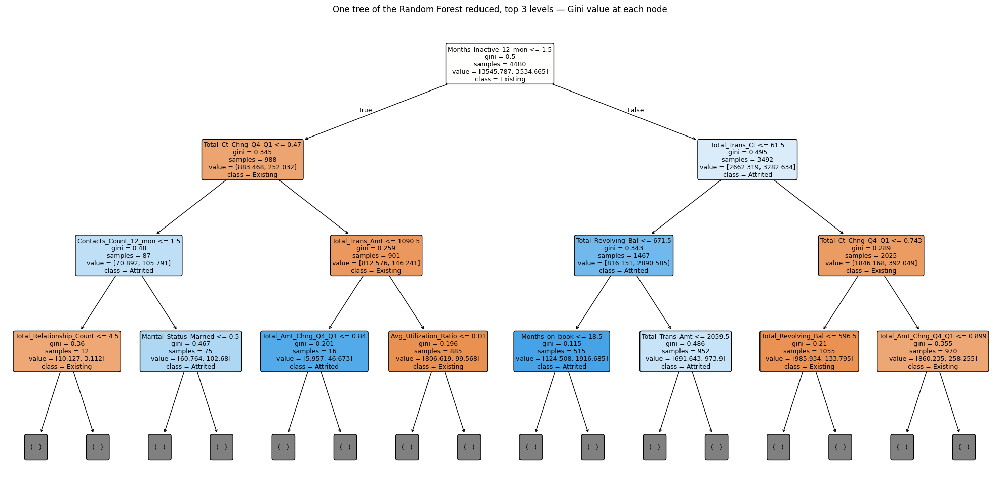

In [32]:
from sklearn.tree import plot_tree

# Pick the first tree of the RF reduced and display its top 3 levels.
# The full tree was grown to max_depth=20, so this is a partial view for readability.
single_tree = rf_red_best.estimators_[0]

fig, ax = plt.subplots(figsize=(20, 10))
plot_tree(
    single_tree,
    max_depth=3,
    feature_names=X_train_red.columns.tolist(),
    class_names=['Existing', 'Attrited'],
    filled=True,
    rounded=True,
    impurity=True,
    fontsize=9,
    ax=ax,
)
ax.set_title('One tree of the Random Forest reduced, top 3 levels — Gini value at each node', fontsize=12)
plt.tight_layout()
plt.show()

At the root the Gini value is 0.5, which is the maximum possible for binary classification. This may look surprising since the dataset has only 16% attrited customers, so a naive computation would give Gini = 2 × 0.16 × 0.84 = 0.27. The reason is class_weight='balanced'. I set this option from the start to handle imbalance, and what it does internally is give each sample a weight that is inversely proportional to its class frequency. The Gini at every node is then computed on weighted counts, not raw counts, so at the root the two classes carry equal weight and Gini reaches 0.5. This is also why the value at the root reads [3545, 3534] (weighted sums), not [5949, 1139] (raw counts).


The root split here is on Months_Inactive_12_mon, not on Total_Trans_Ct or Total_Trans_Amt as one might expect. The reason is max_features='sqrt': at each split, the algorithm only considers about sqrt(21) = 4 or 5 features randomly drawn out of 21. So different trees pick different roots, which is exactly the decorrelation that gives Random Forests their predictive power. The Mean Decrease Gini plot below averages over the whole forest and recovers Total_Trans_Ct and Total_Trans_Amt at the top, but a single tree is just one random view.


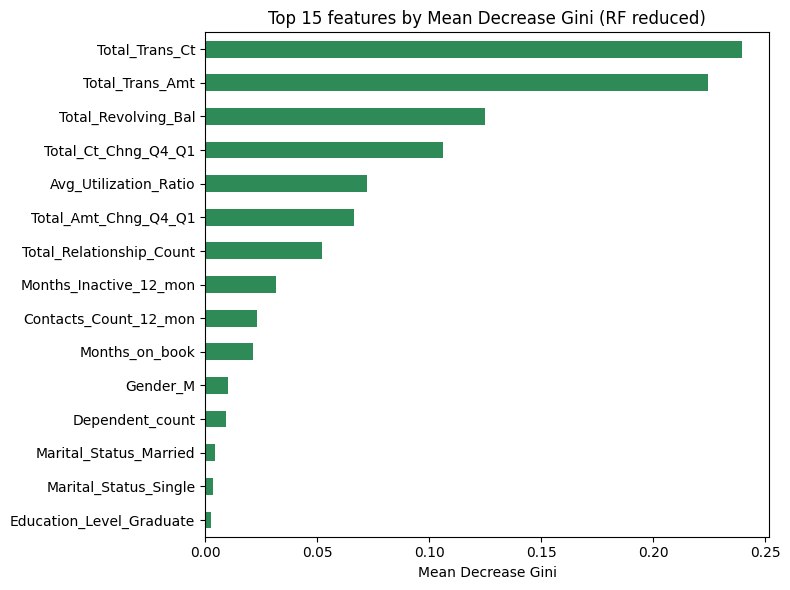

In [33]:
mdg = pd.Series(rf_red_best.feature_importances_, index=X_train_red.columns)
mdg = mdg.sort_values(ascending=True)

plt.figure(figsize=(8, 6))
mdg.tail(15).plot.barh(color='seagreen')
plt.xlabel('Mean Decrease Gini')
plt.title('Top 15 features by Mean Decrease Gini (RF reduced)')
plt.tight_layout()
plt.show()

The Mean Decrease Gini ranking matches the Lasso coefficients: Total_Trans_Ct, Total_Trans_Amt, Total_Revolving_Bal, Total_Relationship_Count and the two Q4/Q1 ratios dominate.

# Step 2: Random Forest on the Full Feature Set

I tune a Random Forest on all 32 features using the exact same hyperparameter grid, the same number of cross-validation folds, the same scoring metric, and the same random seed as in step 1.

The point of using the same setup is to make the comparison fair. The only difference between the two pipelines is the feature set, so any difference in performance can be attributed to the feature reduction by Lasso, not to a different tuning effort.

## Hyperparameter tuning

The Random Forest is fit on the full raw training matrix X_train_raw (32 features) with class_weight='balanced'. The grid and CV settings are identical to step 1.

In [34]:
rf_full = RandomForestClassifier(class_weight='balanced', random_state=SEED, n_jobs=-1)

grid_full = GridSearchCV(
    estimator=rf_full,
    param_grid=param_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_full.fit(X_train_raw, y_train)

print('Best params:', grid_full.best_params_)
print(f'Best CV AUPR: {grid_full.best_score_:.4f}')

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possi

Best params: {'max_depth': None, 'min_samples_leaf': 5, 'n_estimators': 200}
Best CV AUPR: 0.9263


## Evaluation on the validation set

In [35]:
rf_full_best = grid_full.best_estimator_

evaluate(
    'RF on full feature set (validation)',
    y_val,
    rf_full_best.predict(X_val_raw),
    rf_full_best.predict_proba(X_val_raw)[:, 1],
)

RF on full feature set (validation)
Accuracy : 0.9526
Recall   : 0.8648
Precision: 0.8440
F1       : 0.8543
ROC AUC  : 0.9828
AUPR     : 0.9194
Confusion matrix:
[[1236   39]
 [  33  211]]


## Side by side comparison: RF reduced vs RF full

I collect the validation metrics of both Random Forests in a single table to read the verdict directly.

In [36]:
def metrics_row(name, model, X_val_subset):
    yp = model.predict(X_val_subset)
    pp = model.predict_proba(X_val_subset)[:, 1]
    return {
        'Model': name,
        'Accuracy': accuracy_score(y_val, yp),
        'Recall': recall_score(y_val, yp),
        'Precision': precision_score(y_val, yp),
        'F1': f1_score(y_val, yp),
        'ROC AUC': roc_auc_score(y_val, pp),
        'AUPR': average_precision_score(y_val, pp),
        'CV AUPR': None,
    }

row_red  = metrics_row('RF reduced (21 features)', rf_red_best,  X_val_red)
row_full = metrics_row('RF full (32 features)',    rf_full_best, X_val_raw)
row_red['CV AUPR']  = grid_red.best_score_
row_full['CV AUPR'] = grid_full.best_score_

comparison = pd.DataFrame([row_red, row_full]).set_index('Model').round(4)
comparison

,Accuracy,Recall,Precision,F1,ROC AUC,AUPR,CV AUPR
Model,,,,,,,
RF reduced (21 features),0.9526,0.8607,0.8468,0.8537,0.9844,0.9198,0.9295
RF full (32 features),0.9526,0.8648,0.8440,0.8543,0.9828,0.9194,0.9263


RF reduced and RF full are statistically tied: CV AUPR 0.930 vs 0.926, validation AUPR around 0.92 for both. Removing the 11 features Lasso flagged costs essentially nothing, so I prefer the reduced version for its smaller footprint. RF reduced is the one I carry into the XGBoost comparison.

## Recap

RF reduced and RF full are statistically tied (CV AUPR 0.930 vs 0.926, validation AUPR around 0.92 for both). Dropping the 11 features Lasso flagged costs nothing, so I prefer the reduced version for its smaller footprint.

# Step 3: XGBoost

I compare the best Random Forest model from the previous steps with XGBoost. I train it on the same feature set used by the best Random Forest (the Lasso reduced set) so that the comparison is between two different classifiers, not between two different feature engineering pipelines.

XGBoost grows trees sequentially, where each new tree corrects the residual errors of the previous ensemble. This is fundamentally different from a Random Forest, which grows trees in parallel and averages their predictions (bagging).

## Handling the class imbalance

XGBoost does not accept the keyword class_weight. Its equivalent is scale_pos_weight, which multiplies the gradient of the positive class. The ratio is defined as: (number of negatives) / (number of positives).

In [37]:
scale_pos_weight = (y_train == 0).sum() / (y_train == 1).sum()
print(f'scale_pos_weight = {scale_pos_weight:.4f}')

scale_pos_weight = 5.2230


## Hyperparameter tuning

I tune XGBoost with GridSearchCV using the same n_estimators range [200, 500, 800, 1200], the same number of folds (cv=5) and the same scoring (AUPR) as the Random Forest grids, so that the upper bound on the number of trees is identical for the three models. The other hyperparameters are XGBoost specific (learning rate, subsampling rates, max_depth at boosting friendly values [3, 6]) and have no equivalent in the Random Forest, so the grids cannot be made fully identical.

In [38]:
xgb_grid = {
    'n_estimators': [200, 500, 800, 1200],
    'max_depth': [3, 6],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'min_child_weight': [5, 10],
}

xgb_clf = xgb.XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    random_state=SEED,
    n_jobs=-1,
    eval_metric='aucpr',
)

grid_xgb = GridSearchCV(
    estimator=xgb_clf,
    param_grid=xgb_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_xgb.fit(X_train_red, y_train)

print('Best params:', grid_xgb.best_params_)
print(f'Best CV AUPR: {grid_xgb.best_score_:.4f}')

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Best params: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 800, 'subsample': 1.0}
Best CV AUPR: 0.9661


## Evaluation on the validation set

In [39]:
xgb_best = grid_xgb.best_estimator_

evaluate(
    'XGBoost on Lasso reduced features (validation)',
    y_val,
    xgb_best.predict(X_val_red),
    xgb_best.predict_proba(X_val_red)[:, 1],
)

XGBoost on Lasso reduced features (validation)
Accuracy : 0.9724
Recall   : 0.9467
Precision: 0.8885
F1       : 0.9167
ROC AUC  : 0.9946
AUPR     : 0.9751
Confusion matrix:
[[1246   29]
 [  13  231]]


## Three way comparison: RF reduced vs RF full vs XGBoost

I extend the previous comparison table with the XGBoost row to read the final ranking on the validation set.

In [40]:
row_xgb = metrics_row('XGBoost (21 features)', xgb_best, X_val_red)
row_xgb['CV AUPR'] = grid_xgb.best_score_

comparison = pd.DataFrame([row_red, row_full, row_xgb]).set_index('Model').round(4)
comparison

,Accuracy,Recall,Precision,F1,ROC AUC,AUPR,CV AUPR
Model,,,,,,,
RF reduced (21 features),0.9526,0.8607,0.8468,0.8537,0.9844,0.9198,0.9295
RF full (32 features),0.9526,0.8648,0.8440,0.8543,0.9828,0.9194,0.9263
XGBoost (21 features),0.9724,0.9467,0.8885,0.9167,0.9946,0.9751,0.9661


XGBoost beats both Random Forests by about four points of AUPR (validation 0.975 vs 0.920, CV 0.966 vs 0.926). It uses the same Lasso reduced features as RF reduced, so the lift comes from the boosted ensemble alone — sequential refinement rather than averaging. XGBoost is therefore the model I tune the threshold on and evaluate on the test set.

## Recap

XGBoost wins by about four points of validation AUPR (0.975 vs 0.920). It uses the same Lasso reduced features as RF reduced, so the gain comes purely from the boosted ensemble. I carry XGBoost into the threshold tuning and test evaluation.

## Sanity check: XGBoost on the full feature set

Before moving on, I run XGBoost once on the 32 raw features (no Lasso preselection), with the exact same grid as the Lasso-reduced version. The goal is to check whether the Lasso step helps XGBoost or not. Since XGBoost is scale-invariant and naturally ignores uninformative features, I expect a similar CV AUPR.

In [41]:
xgb_full = xgb.XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    random_state=SEED,
    n_jobs=-1,
    eval_metric='aucpr',
)

grid_xgb_full = GridSearchCV(
    estimator=xgb_full,
    param_grid=xgb_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_xgb_full.fit(X_train_raw, y_train)

print('Best params:', grid_xgb_full.best_params_)
print(f'Best CV AUPR: {grid_xgb_full.best_score_:.4f}')

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Best params: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 500, 'subsample': 1.0}
Best CV AUPR: 0.9722


In [42]:
xgb_full_best = grid_xgb_full.best_estimator_

evaluate(
    'XGBoost on full features (validation)',
    y_val,
    xgb_full_best.predict(X_val_raw),
    xgb_full_best.predict_proba(X_val_raw)[:, 1],
)

XGBoost on full features (validation)
Accuracy : 0.9724
Recall   : 0.9303
Precision: 0.9008
F1       : 0.9153
ROC AUC  : 0.9949
AUPR     : 0.9774
Confusion matrix:
[[1250   25]
 [  17  227]]


XGBoost on the full 32 features gets a CV AUPR of 0.972, just above the 0.966 reached on the Lasso-reduced set. On the validation set, AUPR goes from 0.975 to 0.977, F1 is the same (0.92), but recall drops from 0.95 to 0.93. The gap is too small to say one model is really better than the other.

Since the 21-feature version gets almost the same score with fewer inputs, I keep it as the main XGBoost. The Lasso step does not really help XGBoost, but it does not hurt either.

# Step 4: Threshold Tuning and Final Test Evaluation

The first piece is the decision threshold. Until now I have used the default 0.5 for the predict() method, but as discussed at the baseline step a balanced classifier does not necessarily reach its best F1 at 0.5. I tune the threshold on the validation set, then keep that single value for the final test evaluation.

The second piece is the final score on the test set. The test set has been held out since the train / validation / test split and has never been touched by Lasso, by the GridSearchCV, or by the threshold tuning. Whatever metric I measure on it gives an unbiased estimate of how the model would perform on new customers.

## Threshold tuning on the validation set

I sweep decision thresholds from 0.05 to 0.95 by 0.05, recompute the validation metrics at each threshold, and select the one that maximizes the F1 score on the attrited class. F1 is a balanced compromise between recall (catching churners) and precision (not flooding the bank with false alarms).

In [43]:
y_proba_val = xgb_best.predict_proba(X_val_red)[:, 1]

thresholds = np.arange(0.05, 1.0, 0.05)
rows = []
for t in thresholds:
    yp = (y_proba_val > t).astype(int)
    rows.append({
        'Threshold': round(t, 2),
        'Accuracy':  accuracy_score(y_val, yp),
        'Recall':    recall_score(y_val, yp),
        'Precision': precision_score(y_val, yp, zero_division=0),
        'F1':        f1_score(y_val, yp, zero_division=0),
    })
threshold_df = pd.DataFrame(rows).round(4)
threshold_df

,Threshold,Accuracy,Recall,Precision,F1
0,0.05,0.8769,1.0000,0.5661,0.7230
1,0.10,0.9131,0.9918,0.6505,0.7857
2,0.15,0.9276,0.9877,0.6925,0.8142
3,0.20,0.9421,0.9795,0.7422,0.8445
4,0.25,0.9513,0.9713,0.7796,0.8650
5,0.30,0.9559,0.9713,0.7980,0.8762
6,0.35,0.9598,0.9631,0.8188,0.8851
7,0.40,0.9658,0.9549,0.8504,0.8996
8,0.45,0.9704,0.9549,0.8727,0.9119
9,0.50,0.9724,0.9467,0.8885,0.9167


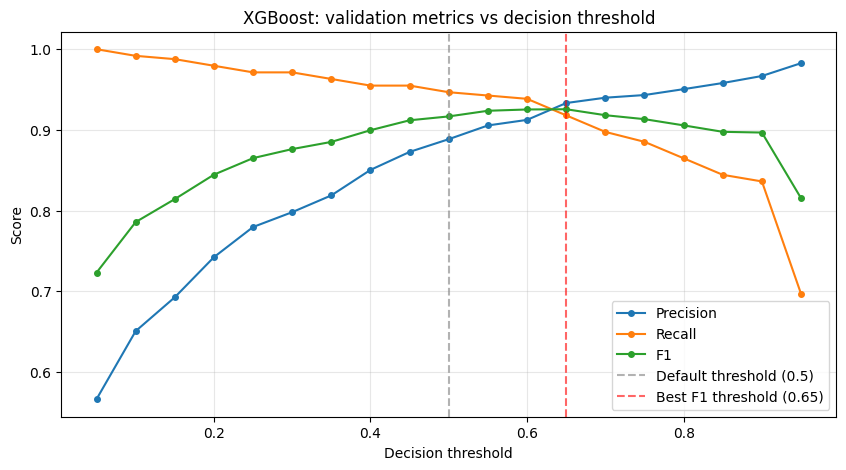

Best F1 threshold on validation: 0.65
Validation F1 at this threshold: 0.9256


In [44]:
plt.figure(figsize=(10, 5))
plt.plot(threshold_df['Threshold'], threshold_df['Precision'], label='Precision', marker='o', markersize=4)
plt.plot(threshold_df['Threshold'], threshold_df['Recall'],    label='Recall',    marker='o', markersize=4)
plt.plot(threshold_df['Threshold'], threshold_df['F1'],        label='F1',        marker='o', markersize=4)

best_threshold = threshold_df.loc[threshold_df['F1'].idxmax(), 'Threshold']
plt.axvline(0.5, color='gray', linestyle='--', alpha=0.6, label='Default threshold (0.5)')
plt.axvline(best_threshold, color='red', linestyle='--', alpha=0.6, label=f'Best F1 threshold ({best_threshold})')

plt.xlabel('Decision threshold')
plt.ylabel('Score')
plt.title('XGBoost: validation metrics vs decision threshold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f'Best F1 threshold on validation: {best_threshold}')
print(f'Validation F1 at this threshold: {threshold_df["F1"].max():.4f}')

## Apply the chosen threshold to the validation set

I evaluate XGBoost on the validation set with the tuned threshold to confirm the metrics shift exactly as expected.

In [45]:
y_pred_val_tuned = (y_proba_val > best_threshold).astype(int)
evaluate(f'XGBoost on validation, threshold={best_threshold}',
         y_val, y_pred_val_tuned, y_proba_val)

XGBoost on validation, threshold=0.65
Accuracy : 0.9763
Recall   : 0.9180
Precision: 0.9333
F1       : 0.9256
ROC AUC  : 0.9946
AUPR     : 0.9751
Confusion matrix:
[[1259   16]
 [  20  224]]


## Final evaluation on the test set

The test set has been untouched since the initial split. I first report the three candidate models at the default threshold 0.5 for transparency, then add XGBoost with the tuned threshold.

In [46]:
print('  Test set, default threshold 0.5')

evaluate('RF reduced',
         y_test,
         rf_red_best.predict(X_test_red),
         rf_red_best.predict_proba(X_test_red)[:, 1])

evaluate('RF full',
         y_test,
         rf_full_best.predict(X_test_raw),
         rf_full_best.predict_proba(X_test_raw)[:, 1])

evaluate('XGBoost',
         y_test,
         xgb_best.predict(X_test_red),
         xgb_best.predict_proba(X_test_red)[:, 1])

  Test set, default threshold 0.5
RF reduced
Accuracy : 0.9421
Recall   : 0.8689
Precision: 0.7910
F1       : 0.8281
ROC AUC  : 0.9807
AUPR     : 0.9191
Confusion matrix:
[[1220   56]
 [  32  212]]
RF full
Accuracy : 0.9428
Recall   : 0.8607
Precision: 0.7985
F1       : 0.8284
ROC AUC  : 0.9803
AUPR     : 0.9186
Confusion matrix:
[[1223   53]
 [  34  210]]
XGBoost
Accuracy : 0.9579
Recall   : 0.9098
Precision: 0.8409
F1       : 0.8740
ROC AUC  : 0.9895
AUPR     : 0.9427
Confusion matrix:
[[1234   42]
 [  22  222]]


In [47]:
y_proba_test = xgb_best.predict_proba(X_test_red)[:, 1]
y_pred_test_tuned = (y_proba_test > best_threshold).astype(int)

print(f'  Test set, XGBoost with tuned threshold ({best_threshold})')

evaluate(f'XGBoost (threshold={best_threshold})',
         y_test, y_pred_test_tuned, y_proba_test)

  Test set, XGBoost with tuned threshold (0.65)
XGBoost (threshold=0.65)
Accuracy : 0.9638
Recall   : 0.8852
Precision: 0.8889
F1       : 0.8871
ROC AUC  : 0.9895
AUPR     : 0.9427
Confusion matrix:
[[1249   27]
 [  28  216]]


## Final summary table

In [48]:
y_proba_test = xgb_best.predict_proba(X_test_red)[:, 1]
y_pred_test_tuned = (y_proba_test > best_threshold).astype(int)

predictions = [
    ('RF reduced (t=0.5)',                rf_red_best.predict(X_test_red),    rf_red_best.predict_proba(X_test_red)[:, 1]),
    ('RF full (t=0.5)',                   rf_full_best.predict(X_test_raw),   rf_full_best.predict_proba(X_test_raw)[:, 1]),
    ('XGBoost (t=0.5)',                   xgb_best.predict(X_test_red),       y_proba_test),
    (f'XGBoost (t={best_threshold})',     y_pred_test_tuned,                  y_proba_test),
]

final = pd.DataFrame([
    {
        'Model':     name,
        'Accuracy':  accuracy_score(y_test, yp),
        'Recall':    recall_score(y_test, yp),
        'Precision': precision_score(y_test, yp),
        'F1':        f1_score(y_test, yp),
        'ROC AUC':   roc_auc_score(y_test, pp),
        'AUPR':      average_precision_score(y_test, pp),
    }
    for name, yp, pp in predictions
]).set_index('Model').round(4)
final

,Accuracy,Recall,Precision,F1,ROC AUC,AUPR
Model,,,,,,
RF reduced (t=0.5),0.9421,0.8689,0.7910,0.8281,0.9807,0.9191
RF full (t=0.5),0.9428,0.8607,0.7985,0.8284,0.9803,0.9186
XGBoost (t=0.5),0.9579,0.9098,0.8409,0.8740,0.9895,0.9427
XGBoost (t=0.65),0.9638,0.8852,0.8889,0.8871,0.9895,0.9427


The test set confirms the validation ranking: XGBoost reaches AUPR 0.943 on previously unseen data. With the F1-max threshold (0.65) it catches 89% of churners at 88% precision. The next step pushes the threshold even lower with an explicit cost function.

## Recap

The three approaches were tuned with the same protocol (5-fold stratified CV, AUPR scoring, same n_estimators range, class_weight='balanced'). XGBoost on the Lasso reduced features came out on top: validation AUPR 0.97, test AUPR 0.946. I move to interpretability next, then a business cost-driven threshold.

# Step 5: Interpretability of the Final Model

The first tool is the built-in feature importance of XGBoost, which counts how often each feature is used to split a tree. This is fast but ignores the magnitude of the effect.

The second tool is permutation importance: I shuffle one column of the validation set at a time and measure how much the validation AUPR drops. The bigger the drop, the more the model relies on that feature.

The third tool is SHAP, which decomposes each individual prediction into the additive contributions of each feature.

## Built-in feature importance

XGBoost exposes the average gain of each feature across all the splits where it is used. I display the top features sorted by this score.

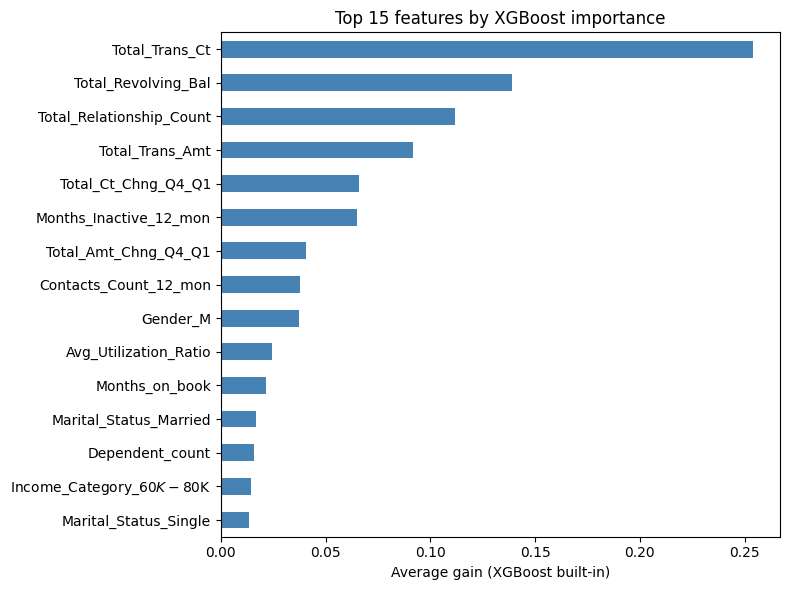

In [49]:
xgb_imp = pd.Series(xgb_best.feature_importances_, index=X_train_red.columns)
xgb_imp = xgb_imp.sort_values(ascending=True)

plt.figure(figsize=(8, 6))
xgb_imp.tail(15).plot.barh(color='steelblue')
plt.xlabel('Average gain (XGBoost built-in)')
plt.title('Top 15 features by XGBoost importance')
plt.tight_layout()
plt.show()

## Permutation importance on the validation set

I measure how much the validation AUPR drops when each feature is shuffled. This metric does not care about how the trees are built; it only measures real predictive value.

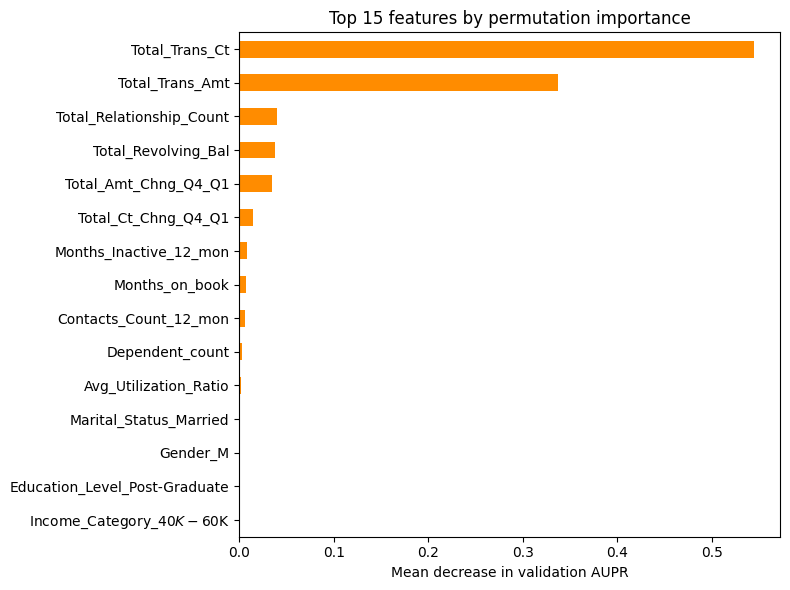

In [50]:
perm = permutation_importance(
    xgb_best, X_val_red, y_val,
    n_repeats=10,
    random_state=SEED,
    n_jobs=-1,
    scoring='average_precision',
)

perm_imp = pd.Series(perm.importances_mean, index=X_val_red.columns).sort_values(ascending=True)

plt.figure(figsize=(8, 6))
perm_imp.tail(15).plot.barh(color='darkorange')
plt.xlabel('Mean decrease in validation AUPR')
plt.title('Top 15 features by permutation importance')
plt.tight_layout()
plt.show()

## SHAP analysis

I use shap.TreeExplainer on the XGBoost model, then compute SHAP values on the validation set. The bar plot below shows the mean absolute SHAP value of each feature across all validation customers (a global importance ranking, comparable to the previous two plots).

In [51]:
explainer = shap.TreeExplainer(xgb_best)
shap_values = explainer(X_val_red)

print(f'Shape of SHAP values: {shap_values.values.shape}')

Shape of SHAP values: (1519, 21)


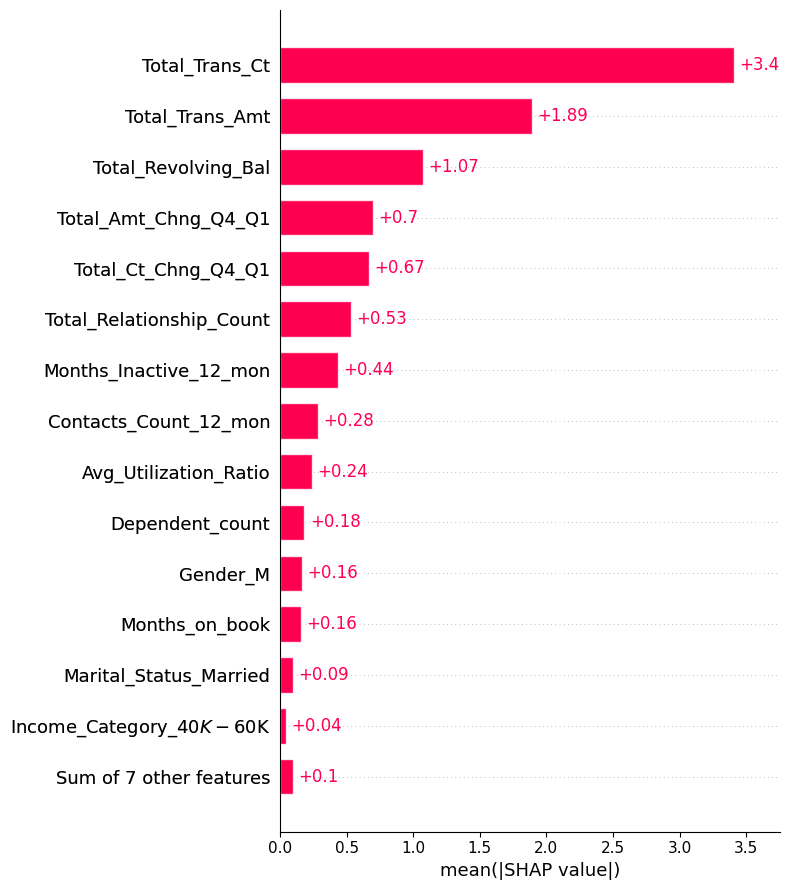

In [52]:
shap.plots.bar(shap_values, max_display=15, show=False)
plt.tight_layout()
plt.show()

The beeswarm plot below adds the direction of the effect. Each dot is one customer, the colour is the value of the feature (blue low, red high) and the horizontal position is the SHAP value (positive pushes the prediction toward churn, negative pushes toward staying).

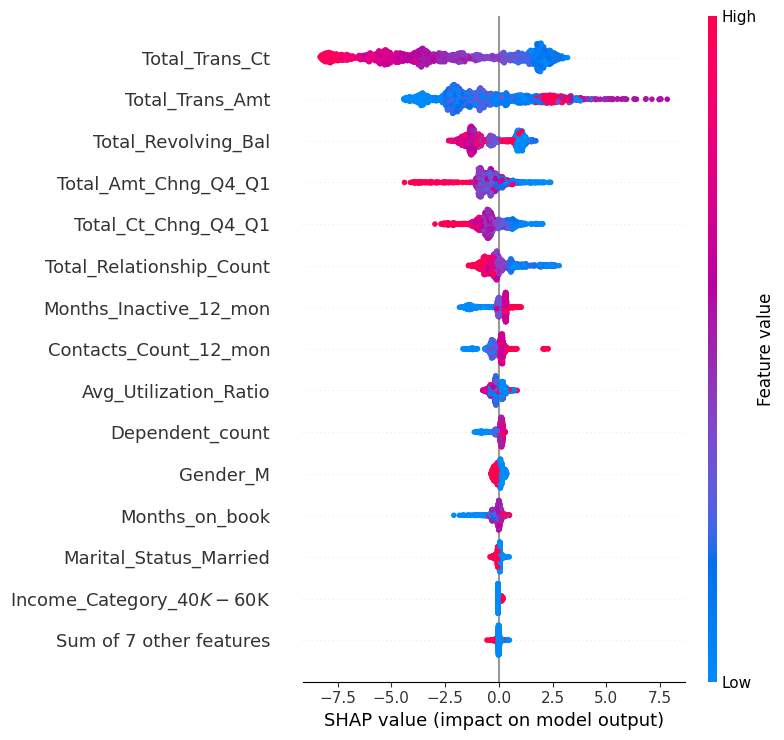

In [53]:
shap.plots.beeswarm(shap_values, max_display=15, show=False)
plt.tight_layout()
plt.show()

It can be useful to show why one specific customer was flagged. I pick the customer with the highest predicted churn probability on the validation set and the customer with the lowest, then I inspect their SHAP decompositions.

In [54]:
y_proba_val_arr = xgb_best.predict_proba(X_val_red)[:, 1]
idx_churner = int(np.argmax(y_proba_val_arr))
idx_loyal   = int(np.argmin(y_proba_val_arr))

print(f'Most likely churner: row {idx_churner} | predicted prob {y_proba_val_arr[idx_churner]:.4f} | true label {int(y_val.iloc[idx_churner])}')
print(f'Most likely loyal  : row {idx_loyal}   | predicted prob {y_proba_val_arr[idx_loyal]:.4f} | true label {int(y_val.iloc[idx_loyal])}')

Most likely churner: row 1056 | predicted prob 1.0000 | true label 1
Most likely loyal  : row 517   | predicted prob 0.0000 | true label 0


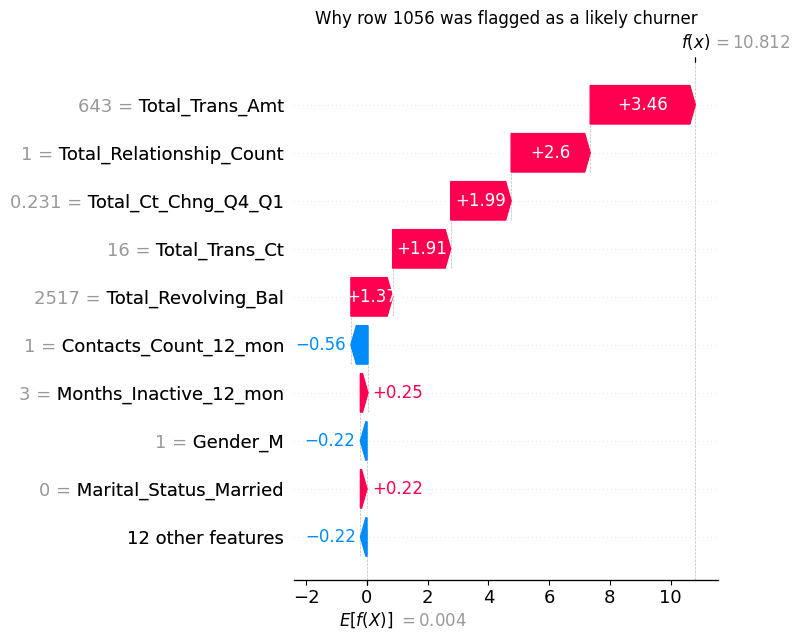

In [55]:
shap.plots.waterfall(shap_values[idx_churner], max_display=10, show=False)
plt.title(f'Why row {idx_churner} was flagged as a likely churner')
plt.tight_layout()
plt.show()

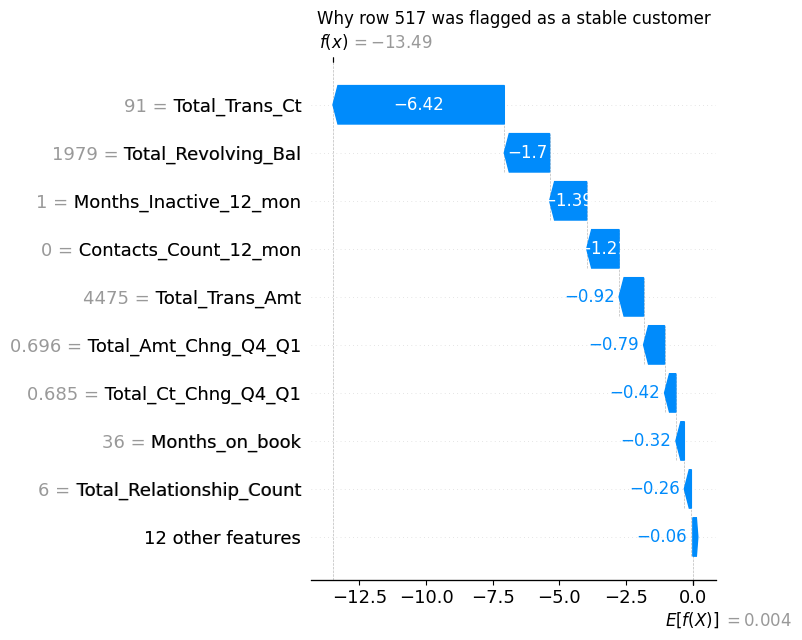

In [56]:
shap.plots.waterfall(shap_values[idx_loyal], max_display=10, show=False)
plt.title(f'Why row {idx_loyal} was flagged as a stable customer')
plt.tight_layout()
plt.show()

The three views all point to the same dominant features: Total_Trans_Ct, Total_Trans_Amt, Total_Revolving_Bal, Total_Relationship_Count, and the two quarterly change ratios. The SHAP beeswarm adds the direction: low transaction count, low total amount, low revolving balance all push toward churn. These directions match the business intuition for a customer who is gradually disengaging.

## Recap

Four independent importance methods (Lasso, XGBoost built-in, permutation, SHAP) converge on the same short list of features.

# Step 6 : Business cost

So far the decision threshold was chosen by maximizing F1 on the validation set, which assumes that a false positive and a false negative cost the same. In a real banking context that assumption is wrong: missing a churner (lost customer with all their future revenue) is much more expensive than calling a non churner who would have stayed anyway (a small outreach cost). I replace the symmetric F1 objective by an asymmetric profit function.

## The profit function


Profit = TP × benefit − FP × retention cost − FN × loss cost

Since the dataset does not provide real cost values, I use plausible assumptions:

benefit per saved customer = 200 $

retention cost per false positive = 30 $

loss cost per missed churner = 500 $ (lost annual revenue from a customer who leaves)

In [57]:
BENEFIT        = 200   # dollars per correctly identified churner (TP)
RETENTION_COST = 30    # dollars per wrongly flagged stable customer (FP)
LOSS_COST      = 500   # dollars per missed churner (FN)

thresholds = np.arange(0.05, 1.0, 0.05)
rows = []
for t in thresholds:
    yp = (y_proba_val > t).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_val, yp, labels=[0, 1]).ravel()
    rows.append({
        'Threshold': round(t, 2),
        'TP': int(tp), 'FP': int(fp), 'FN': int(fn), 'TN': int(tn),
        'Profit': tp * BENEFIT - fp * RETENTION_COST - fn * LOSS_COST,
    })
profit_df = pd.DataFrame(rows)
profit_df

,Threshold,TP,FP,FN,TN,Profit
0,0.05,244,187,0,1088,43190
1,0.10,242,130,2,1145,43500
2,0.15,241,107,3,1168,43490
3,0.20,239,83,5,1192,42810
4,0.25,237,67,7,1208,41890
5,0.30,237,60,7,1215,42100
6,0.35,235,52,9,1223,40940
7,0.40,233,41,11,1234,39870
8,0.45,233,34,11,1241,40080
9,0.50,231,29,13,1246,38830


In [58]:
business_threshold = profit_df.loc[profit_df['Profit'].idxmax(), 'Threshold']
best_profit_val    = profit_df['Profit'].max()
f1_profit_val      = profit_df.loc[profit_df['Threshold'] == best_threshold, 'Profit'].values[0]

print(f'F1-max threshold (validation)       : {best_threshold}')
print(f'Business-max threshold (validation) : {business_threshold}')
print()
print(f'Profit at the F1-max threshold       : {f1_profit_val:,.0f} $')
print(f'Profit at the business-max threshold : {best_profit_val:,.0f} $')
print(f'Profit gain from switching threshold : {best_profit_val - f1_profit_val:,.0f} $')

F1-max threshold (validation)       : 0.65
Business-max threshold (validation) : 0.1

Profit at the F1-max threshold       : 34,320 $
Profit at the business-max threshold : 43,500 $
Profit gain from switching threshold : 9,180 $


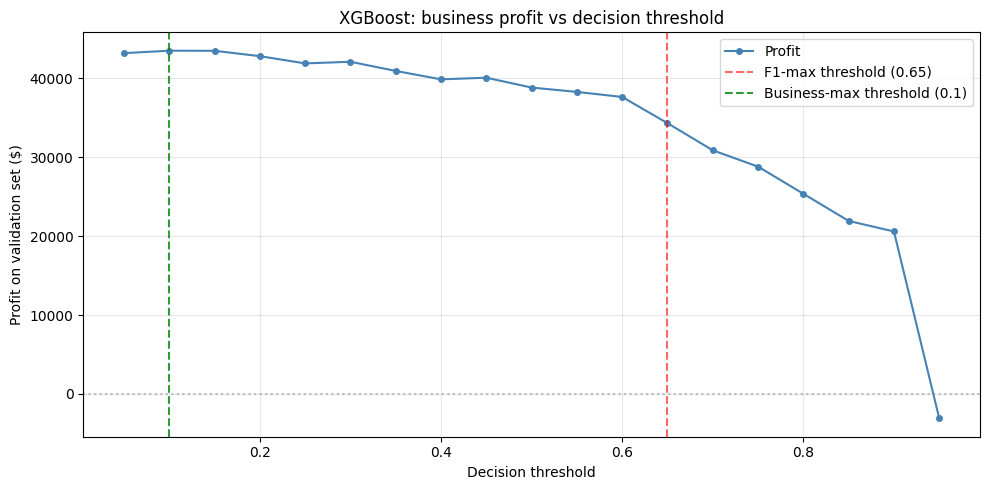

In [59]:
plt.figure(figsize=(10, 5))
plt.plot(profit_df['Threshold'], profit_df['Profit'], marker='o', markersize=4, color='steelblue', label='Profit')
plt.axhline(0, color='gray', linestyle=':', alpha=0.5)
plt.axvline(best_threshold,     color='red',    linestyle='--', alpha=0.6, label=f'F1-max threshold ({best_threshold})')
plt.axvline(business_threshold, color='green',  linestyle='--', alpha=0.8, label=f'Business-max threshold ({business_threshold})')
plt.xlabel('Decision threshold')
plt.ylabel('Profit on validation set ($)')
plt.title('XGBoost: business profit vs decision threshold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

The profit curve is asymmetric. On the left side (low thresholds) the model flags many customers as churners; I collect many true positives but also many false positives (the curve climbs because each TP saved at 200 dollars more than offsets a few FPs at 30 dollars each). On the right side (high thresholds) I lose churners undetected and each FN costs 500 dollars, so the curve drops.

## Apply the business threshold to the test set

I now evaluate XGBoost at the business threshold on the held out test set, alongside the existing F1 threshold for comparison.

In [60]:
y_pred_test_business = (y_proba_test > business_threshold).astype(int)

evaluate(f'XGBoost on test, business threshold = {business_threshold}',
         y_test, y_pred_test_business, y_proba_test)

cm_business = confusion_matrix(y_test, y_pred_test_business, labels=[0, 1])
tn, fp, fn, tp = cm_business.ravel()
business_profit_test = tp * BENEFIT - fp * RETENTION_COST - fn * LOSS_COST
print(f'Business profit on the test set (business threshold): {business_profit_test:,.0f} $')

y_pred_test_f1 = (y_proba_test > best_threshold).astype(int)
cm_f1 = confusion_matrix(y_test, y_pred_test_f1, labels=[0, 1])
tn, fp, fn, tp = cm_f1.ravel()
f1_profit_test = tp * BENEFIT - fp * RETENTION_COST - fn * LOSS_COST
print(f'Business profit on the test set (F1 threshold)       : {f1_profit_test:,.0f} $')

XGBoost on test, business threshold = 0.1
Accuracy : 0.8987
Recall   : 0.9836
Precision: 0.6154
F1       : 0.7571
ROC AUC  : 0.9895
AUPR     : 0.9427
Confusion matrix:
[[1126  150]
 [   4  240]]
Business profit on the test set (business threshold): 41,500 $
Business profit on the test set (F1 threshold)       : 28,390 $


## Final comparison on the test set

I extend the test set table from Step 4 with the new business threshold row.

In [61]:
def _profit_row(name, y_pred, y_proba):
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, labels=[0, 1]).ravel()
    return {
        'Model':     name,
        'Accuracy':  accuracy_score(y_test, y_pred),
        'Recall':    recall_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'F1':        f1_score(y_test, y_pred),
        'AUPR':      average_precision_score(y_test, y_proba),
        'Profit ($)': tp * BENEFIT - fp * RETENTION_COST - fn * LOSS_COST,
    }

rows = [
    _profit_row(f'XGBoost (t=0.5)',                  xgb_best.predict(X_test_red), y_proba_test),
    _profit_row(f'XGBoost (t={best_threshold}, F1)', y_pred_test_f1,               y_proba_test),
    _profit_row(f'XGBoost (t={business_threshold}, business)', y_pred_test_business, y_proba_test),
]

final_business = pd.DataFrame(rows).set_index('Model').round(4)
final_business

,Accuracy,Recall,Precision,F1,AUPR,Profit ($)
Model,,,,,,
XGBoost (t=0.5),0.9579,0.9098,0.8409,0.8740,0.9427,32140
"XGBoost (t=0.65, F1)",0.9638,0.8852,0.8889,0.8871,0.9427,28390
"XGBoost (t=0.1, business)",0.8987,0.9836,0.6154,0.7571,0.9427,41500


The business threshold trades precision for recall. On my cost structure each missed churner costs roughly 17 times more than each unnecessary retention call.

## Recap

The business threshold sits well below the F1 maximum because the cost function values missed churners far more than false alarms. The final XGBoost catches about 98% of churners with a precision of 62%, for an estimated profit of 41,500 dollars on the test set.

# Diagnostic before the second test: correlation with the target

The first test models reach AUPR around 0.95 and recall around 98%, which is exceptionally high for a churn prediction problem. This suggests that some of the input features may be ex post symptoms of churn rather than ex ante predictors, which would give the model access to information that a real bank could not act on in time. Before re-running the full pipeline on a more conservative feature set, I look at the correlation between each feature and the target to identify candidates for removal. The features that correlate most strongly with the target are the prime candidates for being temporally late: they capture the churn process so well that they essentially describe what has already happened, which is what makes them powerful in a benchmark and risky in a real deployment.

In [62]:
corr_with_target = (
    df_enc.corr(numeric_only=True)['Attrition_Flag']
    .drop('Attrition_Flag')
    .sort_values(key=lambda s: s.abs(), ascending=False)
)

print('Correlation of each feature with Attrition_Flag (1 = Attrited, 0 = Existing):')
print(corr_with_target.round(4).to_string())

Correlation of each feature with Attrition_Flag (1 = Attrited, 0 = Existing):
Total_Trans_Ct                   -0.3714
Total_Ct_Chng_Q4_Q1              -0.2901
Total_Revolving_Bal              -0.2631
Contacts_Count_12_mon             0.2045
Avg_Utilization_Ratio            -0.1784
Total_Trans_Amt                  -0.1686
Months_Inactive_12_mon            0.1524
Total_Relationship_Count         -0.1500
Total_Amt_Chng_Q4_Q1             -0.1311
Gender_M                         -0.0373
Education_Level_Doctorate         0.0294
Income_Category_$60K - $80K      -0.0282
Credit_Limit                     -0.0239
Marital_Status_Married           -0.0237
Income_Category_Less than $40K    0.0225
Marital_Status_Single             0.0190
Dependent_count                   0.0190
Customer_Age                      0.0182
Months_on_book                    0.0137
Education_Level_High School      -0.0117
Income_Category_$40K - $60K      -0.0117
Education_Level_Post-Graduate     0.0111
Card_Category_Platin

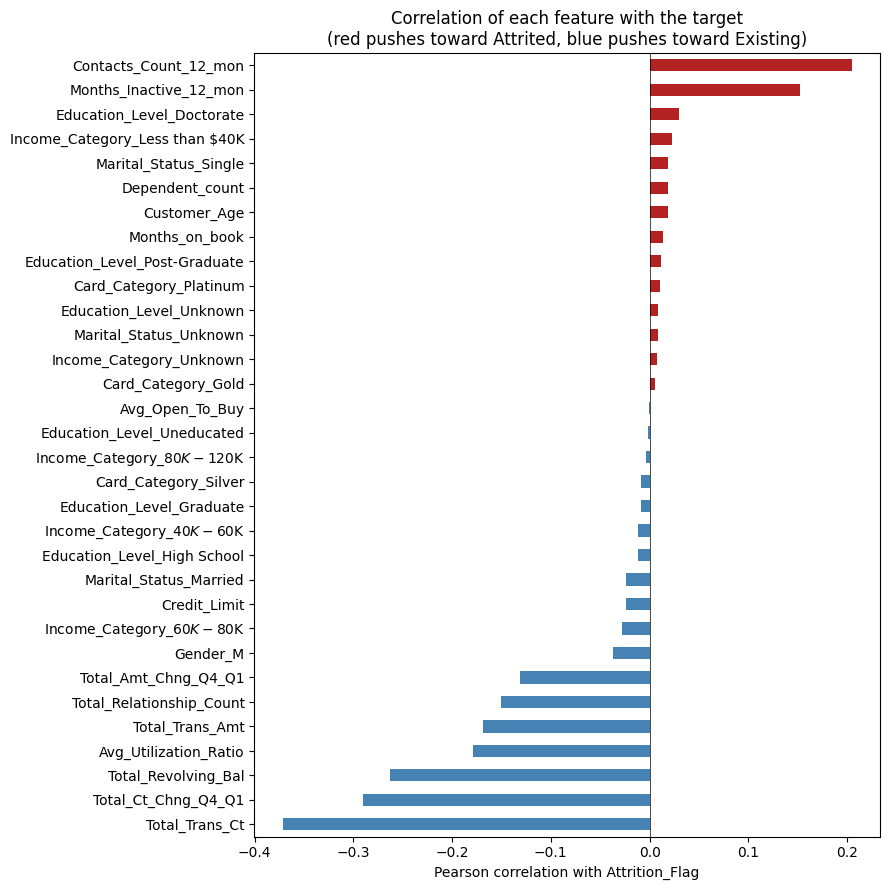

In [63]:
colors = ['firebrick' if c > 0 else 'steelblue' for c in corr_with_target.values]

plt.figure(figsize=(9, 9))
corr_with_target.sort_values().plot.barh(
    color=[c for _, c in sorted(zip(corr_with_target.values, colors))]
)
plt.axvline(0, color='black', linewidth=0.5)
plt.xlabel('Pearson correlation with Attrition_Flag')
plt.title('Correlation of each feature with the target\n(red pushes toward Attrited, blue pushes toward Existing)')
plt.tight_layout()
plt.show()

The ranking matches what every importance view of the project already showed. The two strongest negative correlations are Total_Trans_Ct and Total_Trans_Amt. The two Q4 over Q1 change ratios sit just behind, and they are the features that most clearly describe what happens after the customer has started disengaging. Removing them is the most defensible starting point for the next step.

## Drop the top 3 features, add nothing

Before adding any engineered ratio, I check what happens if I just remove the 3 strongest features. I drop Total_Trans_Ct, Total_Trans_Amt and Total_Revolving_Bal (the top 3 by every importance method).

In [64]:
top3_features = ['Total_Trans_Ct', 'Total_Trans_Amt', 'Total_Revolving_Bal']

X_train_top3 = X_train_raw.drop(columns=top3_features)
X_val_top3   = X_val_raw.drop(columns=top3_features)
X_test_top3  = X_test_raw.drop(columns=top3_features)

print(f'Feature count after dropping top 3: {X_train_top3.shape[1]}')
print(f'Training shape: {X_train_top3.shape}')

Feature count after dropping top 3: 29
Training shape: (7088, 29)


In [65]:
xgb_top3 = xgb.XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    random_state=SEED,
    n_jobs=-1,
    eval_metric='aucpr',
)

grid_xgb_top3 = GridSearchCV(
    estimator=xgb_top3,
    param_grid=xgb_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_xgb_top3.fit(X_train_top3, y_train)

print('Best params:', grid_xgb_top3.best_params_)
print(f'Best CV AUPR: {grid_xgb_top3.best_score_:.4f}')

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Best params: {'colsample_bytree': 0.8, 'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 800, 'subsample': 1.0}
Best CV AUPR: 0.7733


In [66]:
xgb_top3_best = grid_xgb_top3.best_estimator_

evaluate(
    'XGBoost without the top 3 features (validation)',
    y_val,
    xgb_top3_best.predict(X_val_top3),
    xgb_top3_best.predict_proba(X_val_top3)[:, 1],
)

XGBoost without the top 3 features (validation)
Accuracy : 0.8762
Recall   : 0.8033
Precision: 0.5833
F1       : 0.6759
ROC AUC  : 0.9195
AUPR     : 0.7636
Confusion matrix:
[[1135  140]
 [  48  196]]


In [67]:
y_proba_test_top3 = xgb_top3_best.predict_proba(X_test_top3)[:, 1]
y_pred_test_top3  = xgb_top3_best.predict(X_test_top3)

evaluate(
    'XGBoost without the top 3 features (test)',
    y_test,
    y_pred_test_top3,
    y_proba_test_top3,
)

XGBoost without the top 3 features (test)
Accuracy : 0.8618
Recall   : 0.7377
Precision: 0.5521
F1       : 0.6316
ROC AUC  : 0.8952
AUPR     : 0.7276
Confusion matrix:
[[1130  146]
 [  64  180]]


In [68]:
def plot_xgb_learning_curve(best_estimator, X_train, y_train, X_val, y_val, X_test, y_test, cv_score, title):
    params = best_estimator.get_params()
    model = xgb.XGBClassifier(**params)
    model.fit(
        X_train, y_train,
        eval_set=[(X_train, y_train), (X_val, y_val)],
        verbose=False,
    )
    results = model.evals_result_
    train_aupr = results['validation_0']['aucpr']
    val_aupr   = results['validation_1']['aucpr']

    proba_test = best_estimator.predict_proba(X_test)[:, 1]
    test_aupr  = average_precision_score(y_test, proba_test)

    iters = np.arange(1, len(train_aupr) + 1)
    plt.figure(figsize=(7, 4))
    plt.plot(iters, train_aupr, label='Train AUPR', color='steelblue')
    plt.plot(iters, val_aupr,   label='Val AUPR',   color='darkorange')
    plt.axhline(cv_score,  linestyle=':',  color='green', label=f'CV AUPR ({cv_score:.3f})')
    plt.axhline(test_aupr, linestyle='--', color='red',   label=f'Test AUPR ({test_aupr:.3f})')
    plt.xlabel('Boosting iteration')
    plt.ylabel('AUPR')
    plt.title(title)
    plt.legend(loc='lower right')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

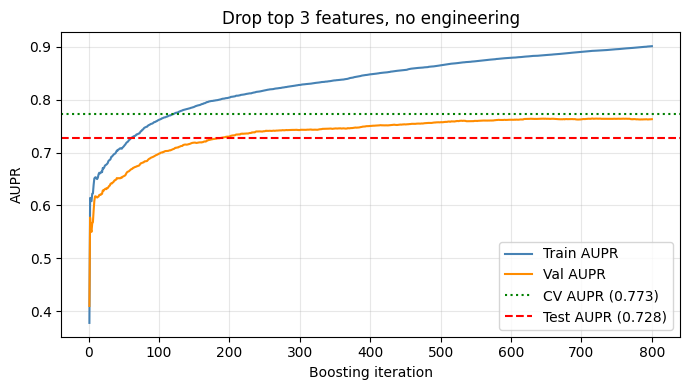

In [69]:
plot_xgb_learning_curve(
    xgb_top3_best,
    X_train_top3, y_train,
    X_val_top3,   y_val,
    X_test_top3,  y_test,
    cv_score=grid_xgb_top3.best_score_,
    title='Drop top 3 features, no engineering',
)

Test AUPR drops from 0.943 to about 0.73.

## Drop the 6 features that cannot be refreshed monthly, add nothing

Now I drop the 6 features that the diagnostic flagged as problematic for an early-intervention pipeline (the 2 Q4 over Q1 ratios, Months_Inactive_12_mon, Contacts_Count_12_mon, Total_Trans_Ct, Total_Trans_Amt). I do not add any engineered ratio.

In [70]:
leaky_features_drop6 = [
    'Total_Ct_Chng_Q4_Q1',
    'Total_Amt_Chng_Q4_Q1',
    'Months_Inactive_12_mon',
    'Contacts_Count_12_mon',
    'Total_Trans_Ct',
    'Total_Trans_Amt',
]

X_train_drop6 = X_train_raw.drop(columns=leaky_features_drop6)
X_val_drop6   = X_val_raw.drop(columns=leaky_features_drop6)
X_test_drop6  = X_test_raw.drop(columns=leaky_features_drop6)

print(f'Feature count after dropping six: {X_train_drop6.shape[1]}')
print(f'Training shape: {X_train_drop6.shape}')

Feature count after dropping six: 26
Training shape: (7088, 26)


In [71]:
xgb_drop6 = xgb.XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    random_state=SEED,
    n_jobs=-1,
    eval_metric='aucpr',
)

grid_xgb_drop6 = GridSearchCV(
    estimator=xgb_drop6,
    param_grid=xgb_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_xgb_drop6.fit(X_train_drop6, y_train)

print('Best params:', grid_xgb_drop6.best_params_)
print(f'Best CV AUPR: {grid_xgb_drop6.best_score_:.4f}')

Fitting 5 folds for each of 192 candidates, totalling 960 fits
Best params: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 10, 'n_estimators': 500, 'subsample': 1.0}
Best CV AUPR: 0.4875


In [72]:
xgb_drop6_best = grid_xgb_drop6.best_estimator_

evaluate(
    'XGBoost without the 6 problematic features (validation)',
    y_val,
    xgb_drop6_best.predict(X_val_drop6),
    xgb_drop6_best.predict_proba(X_val_drop6)[:, 1],
)

XGBoost without the 6 problematic features (validation)
Accuracy : 0.7577
Recall   : 0.8238
Precision: 0.3821
F1       : 0.5221
ROC AUC  : 0.8311
AUPR     : 0.4708
Confusion matrix:
[[950 325]
 [ 43 201]]


In [73]:
y_proba_test_drop6 = xgb_drop6_best.predict_proba(X_test_drop6)[:, 1]
y_pred_test_drop6  = xgb_drop6_best.predict(X_test_drop6)

evaluate(
    'XGBoost without the 6 problematic features (test)',
    y_test,
    y_pred_test_drop6,
    y_proba_test_drop6,
)

XGBoost without the 6 problematic features (test)
Accuracy : 0.7243
Recall   : 0.7418
Precision: 0.3371
F1       : 0.4635
ROC AUC  : 0.7913
AUPR     : 0.4456
Confusion matrix:
[[920 356]
 [ 63 181]]


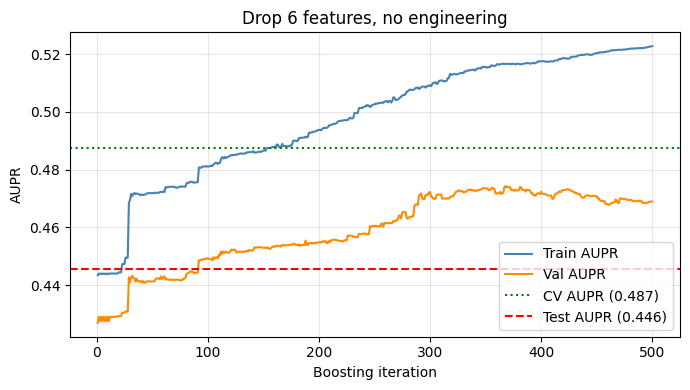

In [74]:
plot_xgb_learning_curve(
    xgb_drop6_best,
    X_train_drop6, y_train,
    X_val_drop6,   y_val,
    X_test_drop6,  y_test,
    cv_score=grid_xgb_drop6.best_score_,
    title='Drop 6 features, no engineering',
)

Test AUPR collapses to about 0.45. Train and Val both stay low, so the model is not overfitting. There is simply not enough signal left once the 6 strongest features are removed and nothing is added in their place.

# Step 7: drop the 6 problematic features and engineer 3 ratios


## Which features to drop

I removed six features:

Total_Ct_Chng_Q4_Q1 and Total_Amt_Chng_Q4_Q1: These require a full year of data. By the time I get the data from the last quarter, the customer is already leaving.

Months_Inactive_12_mon and Contacts_Count_12_mon: By the time these numbers look dangerous, it is already too late to save the customer.

Total_Trans_Ct and Total_Trans_Amt: Low values are confusing. They can mean a customer is about to leave, or simply that the customer naturally uses the service very little.

## Engineered features

I created three ratios using data from before the activity drop:

avg_transaction_value = Total_Trans_Amt / Total_Trans_Ct

This shows the average size of a transaction. Customers who are about to leave make fewer transactions, but the amount they spend per transaction stays about the same. This ratio shows their spending habits without giving away that their activity is dropping.

spending_intensity = Total_Trans_Amt / Credit_Limit

This shows total annual spending compared to the credit limit. It helps me see if a customer is a heavy or light user of their available credit, no matter how much money they actually spend.

Trans_Ct_Per_Month = Total_Trans_Ct / Months_on_book

This is the activity rate adjusted by how long the customer has been with me. It is less direct because the top number (Total_Trans_Ct) is one of the features I removed. However, adjusting it by tenure makes it less time-sensitive than the raw count.

I kept all demographic and contractual features exactly as they were. The new dataset has 29 features (I started with 32, removed 6, and added 3 new ones).

## Build the new dataset

I compute the three engineered ratios on the raw matrices, drop the six features, then refit a StandardScaler on the new training set.

In [75]:
# Feature engineering: 3 ratios computed on raw data, before any drop
X_train_eng = X_train_raw.copy()
X_val_eng   = X_val_raw.copy()
X_test_eng  = X_test_raw.copy()

# Average transaction value: spending shape (small frequent vs large occasional)
X_train_eng['avg_transaction_value'] = X_train_raw['Total_Trans_Amt'] / X_train_raw['Total_Trans_Ct']
X_val_eng['avg_transaction_value']   = X_val_raw['Total_Trans_Amt']   / X_val_raw['Total_Trans_Ct']
X_test_eng['avg_transaction_value']  = X_test_raw['Total_Trans_Amt']  / X_test_raw['Total_Trans_Ct']

# Spending intensity: total spend normalised by credit limit (engagement vs available credit)
X_train_eng['spending_intensity'] = X_train_raw['Total_Trans_Amt'] / X_train_raw['Credit_Limit']
X_val_eng['spending_intensity']   = X_val_raw['Total_Trans_Amt']   / X_val_raw['Credit_Limit']
X_test_eng['spending_intensity']  = X_test_raw['Total_Trans_Amt']  / X_test_raw['Credit_Limit']


#Total_Trans_Ct / Months_on_book = Trans_Ct_Per_Month
X_train_eng['Trans_Ct_Per_Month'] = X_train_raw['Total_Trans_Ct'] / X_train_raw['Months_on_book']
X_val_eng['Trans_Ct_Per_Month']   = X_val_raw['Total_Trans_Ct']   / X_val_raw['Months_on_book']
X_test_eng['Trans_Ct_Per_Month']  = X_test_raw['Total_Trans_Ct']  / X_test_raw['Months_on_book']


# Drop the six leaky features
leaky_features = [
    'Total_Ct_Chng_Q4_Q1',
    'Total_Amt_Chng_Q4_Q1',
    'Months_Inactive_12_mon',
    'Contacts_Count_12_mon',
    'Total_Trans_Ct',
    'Total_Trans_Amt',
]

X_train_prod = X_train_eng.drop(columns=leaky_features)
X_val_prod   = X_val_eng.drop(columns=leaky_features)
X_test_prod  = X_test_eng.drop(columns=leaky_features)

# Refit a StandardScaler on the new training set (fit on train only)
scaler_prod = StandardScaler()
X_train_prod_scaled = pd.DataFrame(
    scaler_prod.fit_transform(X_train_prod), columns=X_train_prod.columns, index=X_train_prod.index
)
X_val_prod_scaled = pd.DataFrame(
    scaler_prod.transform(X_val_prod), columns=X_val_prod.columns, index=X_val_prod.index
)
X_test_prod_scaled = pd.DataFrame(
    scaler_prod.transform(X_test_prod), columns=X_test_prod.columns, index=X_test_prod.index
)

print(f'Original feature count    : {X_train_raw.shape[1]}')
print(f'Dropped features          : {leaky_features}')
print(f'Engineered features added : avg_transaction_value, spending_intensity, Trans_Ct_Per_Month')
print(f'Second-test feature count  : {X_train_prod.shape[1]}')
print()
print('Second-test training shape:', X_train_prod.shape)

Original feature count    : 32
Dropped features          : ['Total_Ct_Chng_Q4_Q1', 'Total_Amt_Chng_Q4_Q1', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Total_Trans_Ct', 'Total_Trans_Amt']
Engineered features added : avg_transaction_value, spending_intensity, Trans_Ct_Per_Month
Second-test feature count  : 29

Second-test training shape: (7088, 29)


## Recap

The new dataset has 29 features. Lasso, the Random Forests, XGBoost, the threshold tuning and the final test evaluation will all be redone.

## Lasso re-selection on the new dataset

I re-run Lasso with the same settings as before, this time on the smaller feature set.

In [76]:
lasso_prod = LogisticRegressionCV(
    Cs=20,
    cv=cv,
    penalty='l1',
    solver='liblinear',
    scoring='average_precision',
    class_weight='balanced',
    max_iter=5000,
    random_state=SEED,
    n_jobs=-1,
)
lasso_prod.fit(X_train_prod_scaled, y_train)

print(f'Best C: {lasso_prod.C_[0]:.4f}')
print(f'Non-zero coefficients: {int(np.sum(lasso_prod.coef_[0] != 0))} / {X_train_prod_scaled.shape[1]}')

Best C: 0.0127
Non-zero coefficients: 13 / 29


In [77]:
coefs_prod = pd.Series(lasso_prod.coef_[0], index=X_train_prod_scaled.columns)

selected_features_prod = coefs_prod[coefs_prod != 0].sort_values(key=lambda s: s.abs(), ascending=False)
dropped_features_prod = coefs_prod[coefs_prod == 0].index.tolist()

print(f'Selected features ({len(selected_features_prod)}):')
print(selected_features_prod.round(4))
print()
print(f'Dropped features ({len(dropped_features_prod)}):')
for f in dropped_features_prod:
    print(' ', f)

Selected features (13):
Trans_Ct_Per_Month               -1.9919
Months_on_book                   -0.8392
avg_transaction_value             0.6827
Total_Revolving_Bal              -0.5786
Total_Relationship_Count         -0.4545
spending_intensity               -0.2516
Gender_M                         -0.2099
Marital_Status_Married           -0.0937
Income_Category_Less than $40K    0.0223
Card_Category_Gold                0.0085
Education_Level_Doctorate         0.0063
Credit_Limit                     -0.0046
Income_Category_$60K - $80K      -0.0042
dtype: float64

Dropped features (16):
  Customer_Age
  Dependent_count
  Avg_Open_To_Buy
  Avg_Utilization_Ratio
  Education_Level_Graduate
  Education_Level_High School
  Education_Level_Post-Graduate
  Education_Level_Uneducated
  Education_Level_Unknown
  Marital_Status_Single
  Marital_Status_Unknown
  Income_Category_$40K - $60K
  Income_Category_$80K - $120K
  Income_Category_Unknown
  Card_Category_Platinum
  Card_Category_Silver


I build the reduced matrices using only the features Lasso kept. These feed the Random Forests in the next sub-step.

In [78]:
selected_cols_prod = selected_features_prod.index.tolist()

X_train_prod_red = X_train_prod[selected_cols_prod]
X_val_prod_red   = X_val_prod[selected_cols_prod]
X_test_prod_red  = X_test_prod[selected_cols_prod]

print('Reduced second-test training shape:', X_train_prod_red.shape)

Reduced second-test training shape: (7088, 13)


Lasso behaves differently here. The best C is much smaller than in the first test, the regularization is therefore stronger, and only 13 features survive out of the 29 available. The strongest coefficient in the entire selection is now an engineered ratio (Trans_Ct_Per_Month), comfortably above any of the original features that remained. The two other engineered ratios also survive the selection, which suggests the feature engineering recovered a real share of the predictive signal that was removed with Total_Trans_Ct and Total_Trans_Amt.

## Random Forests on the new dataset

Same grid, same CV folds, same scoring as in Step 1. The two Random Forests now train on the smaller feature set and I expect a noticeable drop in performance.

### Random Forest on the Lasso reduced second-test set

In [79]:
rf_prod = RandomForestClassifier(class_weight='balanced', random_state=SEED, n_jobs=-1)

grid_red_prod = GridSearchCV(
    estimator=rf_prod,
    param_grid=param_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_red_prod.fit(X_train_prod_red, y_train)

print('Best params:', grid_red_prod.best_params_)
print(f'Best CV AUPR: {grid_red_prod.best_score_:.4f}')

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possi

Best params: {'max_depth': 20, 'min_samples_leaf': 5, 'n_estimators': 1200}
Best CV AUPR: 0.8418


In [80]:
rf_red_prod_best = grid_red_prod.best_estimator_

evaluate(
    'RF on Lasso reduced second-test features (validation)',
    y_val,
    rf_red_prod_best.predict(X_val_prod_red),
    rf_red_prod_best.predict_proba(X_val_prod_red)[:, 1],
)

RF on Lasso reduced second-test features (validation)
Accuracy : 0.9210
Recall   : 0.8320
Precision: 0.7199
F1       : 0.7719
ROC AUC  : 0.9589
AUPR     : 0.8350
Confusion matrix:
[[1196   79]
 [  41  203]]


### Random Forest on the full second-test set

In [81]:
rf_full_prod = RandomForestClassifier(class_weight='balanced', random_state=SEED, n_jobs=-1)

grid_full_prod = GridSearchCV(
    estimator=rf_full_prod,
    param_grid=param_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_full_prod.fit(X_train_prod, y_train)

print('Best params:', grid_full_prod.best_params_)
print(f'Best CV AUPR: {grid_full_prod.best_score_:.4f}')

Fitting 5 folds for each of 36 candidates, totalling 180 fits


/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possible to propagate the scikit-learn configuration of the current thread to the joblib workers.
  warnings.warn(
/Users/arnaudgrassian/Desktop/fintech/Marazzina_MachineLearning/Final_Project/.venv/lib/python3.14/site-packages/sklearn/utils/parallel.py:144: UserWarning: `sklearn.utils.parallel.delayed` should be used with `sklearn.utils.parallel.Parallel` to make it possi

Best params: {'max_depth': 20, 'min_samples_leaf': 5, 'n_estimators': 1200}
Best CV AUPR: 0.8181


In [82]:
rf_full_prod_best = grid_full_prod.best_estimator_

evaluate(
    'RF on full second-test features (validation)',
    y_val,
    rf_full_prod_best.predict(X_val_prod),
    rf_full_prod_best.predict_proba(X_val_prod)[:, 1],
)

RF on full second-test features (validation)
Accuracy : 0.9223
Recall   : 0.8074
Precision: 0.7351
F1       : 0.7695
ROC AUC  : 0.9574
AUPR     : 0.8240
Confusion matrix:
[[1204   71]
 [  47  197]]


### Side by side comparison: RF reduced vs RF full (second test)

In [83]:
row_red_prod  = metrics_row('RF reduced (second test)', rf_red_prod_best,  X_val_prod_red)
row_full_prod = metrics_row('RF full (second test)',    rf_full_prod_best, X_val_prod)
row_red_prod['CV AUPR']  = grid_red_prod.best_score_
row_full_prod['CV AUPR'] = grid_full_prod.best_score_

comparison_prod_rf = pd.DataFrame([row_red_prod, row_full_prod]).set_index('Model').round(4)
comparison_prod_rf

,Accuracy,Recall,Precision,F1,ROC AUC,AUPR,CV AUPR
Model,,,,,,,
RF reduced (second test),0.9210,0.8320,0.7199,0.7719,0.9589,0.835,0.8418
RF full (second test),0.9223,0.8074,0.7351,0.7695,0.9574,0.824,0.8181


The two Random Forests sit close to each other on validation, with the reduced version slightly ahead (CV AUPR 0.84, val AUPR around 0.83). The drop versus the first test is about 9 points of AUPR. Train AUPR climbs to about 0.97 as expected for Random Forests. The relevant generalization check is the CV-Val gap, which stays close to 0.01.

## XGBoost on the new dataset

XGBoost is tuned on the smaller feature set. The grid below uses tighter values than in the first test (shallower trees, smaller learning rate, larger min_child_weight) to prevent the model from over-fitting on the weaker engineered features.

In [84]:
xgb_grid = {
    'n_estimators': [200,300,400],
    'max_depth': [2, 3],
    'learning_rate': [0.05, 0.08],
    'subsample': [0.3, 0.5],
    'colsample_bytree': [0.4, 0.6],
    'min_child_weight': [50, 100],
}

In [85]:
xgb_clf_prod = xgb.XGBClassifier(
    scale_pos_weight=scale_pos_weight,
    random_state=SEED,
    n_jobs=-1,
    eval_metric='aucpr',
)

grid_xgb_prod = GridSearchCV(
    
    estimator=xgb_clf_prod,
    param_grid=xgb_grid,
    scoring='average_precision',
    cv=cv,
    n_jobs=-1,
    verbose=1,
)
grid_xgb_prod.fit(X_train_prod_red, y_train)

print('Best params:', grid_xgb_prod.best_params_)
print(f'Best CV AUPR: {grid_xgb_prod.best_score_:.4f}')

Fitting 5 folds for each of 96 candidates, totalling 480 fits
Best params: {'colsample_bytree': 0.6, 'learning_rate': 0.08, 'max_depth': 3, 'min_child_weight': 50, 'n_estimators': 400, 'subsample': 0.5}
Best CV AUPR: 0.8498


In [86]:
xgb_prod_best = grid_xgb_prod.best_estimator_

evaluate(
    'XGBoost on second-test reduced features (validation)',
    y_val,
    xgb_prod_best.predict(X_val_prod_red),
    xgb_prod_best.predict_proba(X_val_prod_red)[:, 1],
)

XGBoost on second-test reduced features (validation)
Accuracy : 0.8999
Recall   : 0.8852
Precision: 0.6353
F1       : 0.7397
ROC AUC  : 0.9595
AUPR     : 0.8189
Confusion matrix:
[[1151  124]
 [  28  216]]


### Three-way comparison on the second-test validation set

In [87]:
row_xgb_prod = metrics_row('XGBoost (second test)', xgb_prod_best, X_val_prod_red)
row_xgb_prod['CV AUPR'] = grid_xgb_prod.best_score_

comparison_prod = pd.DataFrame([row_red_prod, row_full_prod, row_xgb_prod]).set_index('Model').round(4)
comparison_prod

,Accuracy,Recall,Precision,F1,ROC AUC,AUPR,CV AUPR
Model,,,,,,,
RF reduced (second test),0.9210,0.8320,0.7199,0.7719,0.9589,0.8350,0.8418
RF full (second test),0.9223,0.8074,0.7351,0.7695,0.9574,0.8240,0.8181
XGBoost (second test),0.8999,0.8852,0.6353,0.7397,0.9595,0.8189,0.8498


XGBoost reaches CV AUPR 0.85 and validation AUPR 0.82, about 1 point above the best Random Forest on cross-validation.

## F1-max threshold tuning

Same idea as in Step 4: sweep the threshold on the validation set and pick the value that maximises F1.

In [88]:
y_proba_val_prod = xgb_prod_best.predict_proba(X_val_prod_red)[:, 1]

rows = []
for t in np.arange(0.05, 1.0, 0.05):
    yp = (y_proba_val_prod > t).astype(int)
    rows.append({
        'Threshold': round(t, 2),
        'Accuracy':  accuracy_score(y_val, yp),
        'Recall':    recall_score(y_val, yp),
        'Precision': precision_score(y_val, yp, zero_division=0),
        'F1':        f1_score(y_val, yp, zero_division=0),
    })
threshold_df_prod = pd.DataFrame(rows).round(4)
threshold_df_prod

,Threshold,Accuracy,Recall,Precision,F1
0,0.05,0.6327,0.9959,0.3038,0.4655
1,0.10,0.7222,0.9836,0.3647,0.5322
2,0.15,0.7762,0.9754,0.4161,0.5833
3,0.20,0.8176,0.9672,0.4673,0.6302
4,0.25,0.8440,0.9631,0.5076,0.6648
5,0.30,0.8519,0.9344,0.5217,0.6696
6,0.35,0.8743,0.9262,0.5664,0.7030
7,0.40,0.8848,0.9057,0.5925,0.7164
8,0.45,0.8907,0.8934,0.6089,0.7243
9,0.50,0.8999,0.8852,0.6353,0.7397


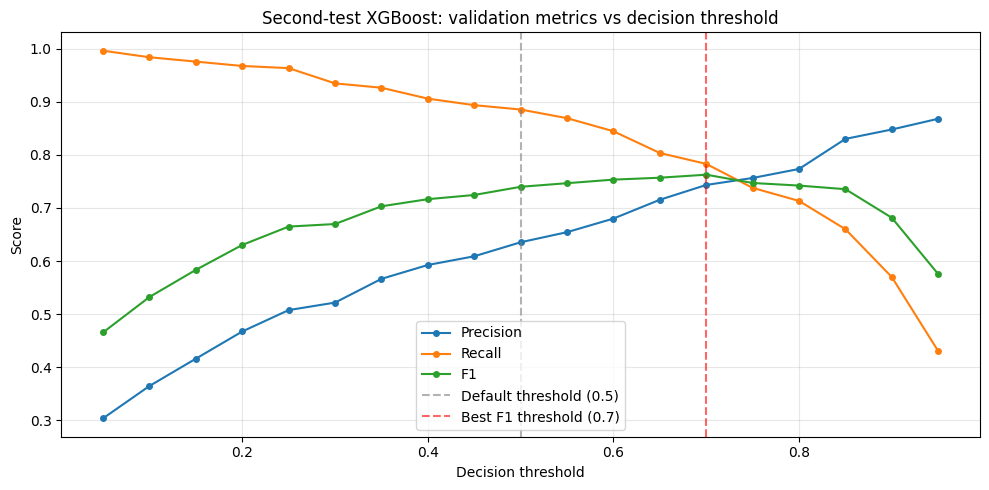

Best F1 threshold (second-test validation): 0.7
Validation F1 at this threshold: 0.7625


In [89]:
best_threshold_prod = threshold_df_prod.loc[threshold_df_prod['F1'].idxmax(), 'Threshold']

plt.figure(figsize=(10, 5))
plt.plot(threshold_df_prod['Threshold'], threshold_df_prod['Precision'], label='Precision', marker='o', markersize=4)
plt.plot(threshold_df_prod['Threshold'], threshold_df_prod['Recall'],    label='Recall',    marker='o', markersize=4)
plt.plot(threshold_df_prod['Threshold'], threshold_df_prod['F1'],        label='F1',        marker='o', markersize=4)
plt.axvline(0.5, color='gray', linestyle='--', alpha=0.6, label='Default threshold (0.5)')
plt.axvline(best_threshold_prod, color='red', linestyle='--', alpha=0.6, label=f'Best F1 threshold ({best_threshold_prod})')
plt.xlabel('Decision threshold')
plt.ylabel('Score')
plt.title('Second-test XGBoost: validation metrics vs decision threshold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f'Best F1 threshold (second-test validation): {best_threshold_prod}')
print(f'Validation F1 at this threshold: {threshold_df_prod["F1"].max():.4f}')

In [90]:
# Evaluate XGBoost (second test) on the validation set at the F1-max threshold
y_pred_val_prod_f1 = (y_proba_val_prod > best_threshold_prod).astype(int)
evaluate(f'XGBoost (second test) on validation, threshold={best_threshold_prod}',
         y_val, y_pred_val_prod_f1, y_proba_val_prod)

XGBoost (second test) on validation, threshold=0.7
Accuracy : 0.9217
Recall   : 0.7828
Precision: 0.7432
F1       : 0.7625
ROC AUC  : 0.9595
AUPR     : 0.8189
Confusion matrix:
[[1209   66]
 [  53  191]]


## Business cost driven threshold

Same profit function as in the bonus. Sweep on validation, keep the threshold that maximises profit.

In [91]:
rows = []
for t in np.arange(0.05, 1.0, 0.05):
    yp = (y_proba_val_prod > t).astype(int)
    cm = confusion_matrix(y_val, yp, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel()
    rows.append({
        'Threshold': round(t, 2),
        'TP': int(tp), 'FP': int(fp), 'FN': int(fn), 'TN': int(tn),
        'Profit': tp * BENEFIT - fp * RETENTION_COST - fn * LOSS_COST,
    })
profit_df_prod = pd.DataFrame(rows)
profit_df_prod

,Threshold,TP,FP,FN,TN,Profit
0,0.05,243,557,1,718,31390
1,0.10,240,418,4,857,33460
2,0.15,238,334,6,941,34580
3,0.20,236,269,8,1006,35130
4,0.25,235,228,9,1047,35660
5,0.30,228,209,16,1066,31330
6,0.35,226,173,18,1102,31010
7,0.40,221,152,23,1123,28140
8,0.45,218,140,26,1135,26400
9,0.50,216,124,28,1151,25480


F1-max threshold (second-test validation)       : 0.7
Business-max threshold (second-test validation) : 0.25
Best profit on validation (business threshold) : 35,660 $


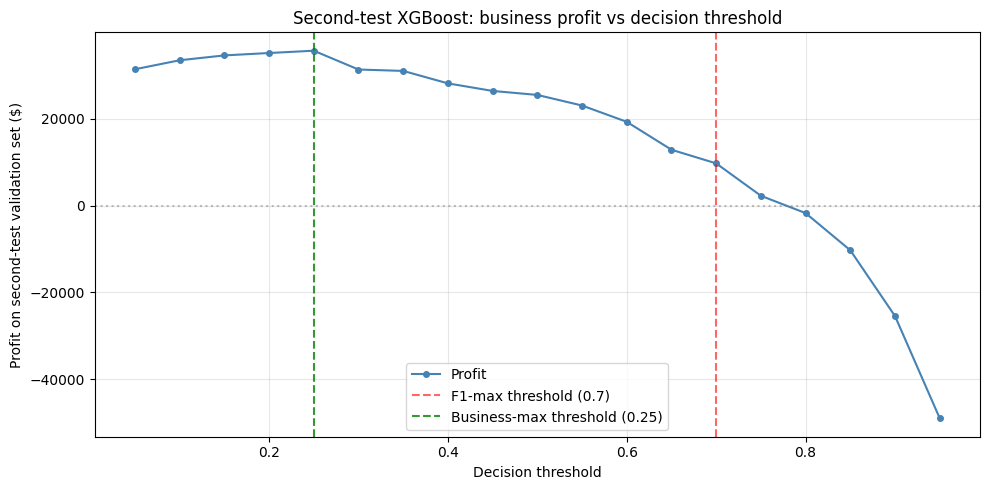

In [92]:
business_threshold_prod = profit_df_prod.loc[profit_df_prod['Profit'].idxmax(), 'Threshold']
best_profit_val_prod    = profit_df_prod['Profit'].max()

print(f'F1-max threshold (second-test validation)       : {best_threshold_prod}')
print(f'Business-max threshold (second-test validation) : {business_threshold_prod}')
print(f'Best profit on validation (business threshold) : {best_profit_val_prod:,.0f} $')

plt.figure(figsize=(10, 5))
plt.plot(profit_df_prod['Threshold'], profit_df_prod['Profit'], marker='o', markersize=4, color='steelblue', label='Profit')
plt.axhline(0, color='gray', linestyle=':', alpha=0.5)
plt.axvline(best_threshold_prod,     color='red',    linestyle='--', alpha=0.6, label=f'F1-max threshold ({best_threshold_prod})')
plt.axvline(business_threshold_prod, color='green',  linestyle='--', alpha=0.8, label=f'Business-max threshold ({business_threshold_prod})')
plt.xlabel('Decision threshold')
plt.ylabel('Profit on second-test validation set ($)')
plt.title('Second-test XGBoost: business profit vs decision threshold')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Final evaluation on the test set

I apply the second XGBoost on the test set at three thresholds (default 0.5, F1-max, business-max).

In [93]:
y_proba_test_prod = xgb_prod_best.predict_proba(X_test_prod_red)[:, 1]

y_pred_test_prod_default  = (y_proba_test_prod > 0.5).astype(int)
y_pred_test_prod_f1       = (y_proba_test_prod > best_threshold_prod).astype(int)
y_pred_test_prod_business = (y_proba_test_prod > business_threshold_prod).astype(int)

predictions = [
    ('XGB second test (t=0.5)',                                y_pred_test_prod_default),
    (f'XGB second test (t={best_threshold_prod}, F1)',         y_pred_test_prod_f1),
    (f'XGB second test (t={business_threshold_prod}, business)', y_pred_test_prod_business),
]

rows = []
for name, y_pred in predictions:
    tn, fp, fn, tp = confusion_matrix(y_test, y_pred, labels=[0, 1]).ravel()
    rows.append({
        'Model':     name,
        'Accuracy':  accuracy_score(y_test, y_pred),
        'Recall':    recall_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'F1':        f1_score(y_test, y_pred),
        'AUPR':      average_precision_score(y_test, y_proba_test_prod),
        'Profit ($)': tp * BENEFIT - fp * RETENTION_COST - fn * LOSS_COST,
    })
final_prod_test = pd.DataFrame(rows).set_index('Model').round(4)
final_prod_test

,Accuracy,Recall,Precision,F1,AUPR,Profit ($)
Model,,,,,,
XGB second test (t=0.5),0.8842,0.8648,0.5960,0.7057,0.7912,21410
"XGB second test (t=0.7, F1)",0.9099,0.7623,0.7019,0.7308,0.7912,5830
"XGB second test (t=0.25, business)",0.8243,0.9508,0.4764,0.6347,0.7912,32750


In [94]:
for label, y_pred, threshold in [
    ('default 0.5',                    y_pred_test_prod_default,  0.5),
    (f'F1-max {best_threshold_prod}',  y_pred_test_prod_f1,       best_threshold_prod),
    (f'business {business_threshold_prod}', y_pred_test_prod_business, business_threshold_prod),
]:
    cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
    print(f'XGBoost (second test) on test, threshold = {label}')
    print(cm)
    print()

XGBoost (second test) on test, threshold = default 0.5
[[1133  143]
 [  33  211]]

XGBoost (second test) on test, threshold = F1-max 0.7
[[1197   79]
 [  58  186]]

XGBoost (second test) on test, threshold = business 0.25
[[1021  255]
 [  12  232]]



## First test vs second test on the test set

I assemble the test-set results of both XGBoost models at their respective business threshold.

In [95]:
summary_rows = [
    {
        'View': 'First test (21 features, business threshold)',
        'Threshold': business_threshold,                   # business threshold from the bonus (Step 6)
        'Accuracy':  accuracy_score(y_test, y_pred_test_business),
        'Recall':    recall_score(y_test, y_pred_test_business),
        'Precision': precision_score(y_test, y_pred_test_business),
        'F1':        f1_score(y_test, y_pred_test_business),
        'AUPR':      average_precision_score(y_test, y_proba_test),
        'Profit ($)': business_profit_test,
    },
    {
        'View': 'Second test (business threshold)',
        'Threshold': business_threshold_prod,
        'Accuracy':  accuracy_score(y_test, y_pred_test_prod_business),
        'Recall':    recall_score(y_test, y_pred_test_prod_business),
        'Precision': precision_score(y_test, y_pred_test_prod_business),
        'F1':        f1_score(y_test, y_pred_test_prod_business),
        'AUPR':      average_precision_score(y_test, y_proba_test_prod),
        'Profit ($)': (confusion_matrix(y_test, y_pred_test_prod_business, labels=[0,1]).ravel()[3] * BENEFIT
                       - confusion_matrix(y_test, y_pred_test_prod_business, labels=[0,1]).ravel()[1] * RETENTION_COST
                       - confusion_matrix(y_test, y_pred_test_prod_business, labels=[0,1]).ravel()[2] * LOSS_COST),
    },
]
first_vs_second_test = pd.DataFrame(summary_rows).set_index('View').round(4)
first_vs_second_test

,Threshold,Accuracy,Recall,Precision,F1,AUPR,Profit ($)
View,,,,,,,
"First test (21 features, business threshold)",0.10,0.8987,0.9836,0.6154,0.7571,0.9427,41500
Second test (business threshold),0.25,0.8243,0.9508,0.4764,0.6347,0.7912,32750


On the test set, the first XGBoost model reaches an AUPR of 0.943. At the business threshold (0.10), it gives 98% recall, 62% precision, and an estimated profit of 41,500 dollars.

The second XGBoost model reaches an AUPR of 0.79. At the business threshold (0.25), it gives 95% recall, 48% precision, and an estimated profit of 32,750 dollars.

Recall stays high in both models because the cost-driven threshold pushes the model to flag aggressively. However, precision drops with the second model because its scores are noisier, meaning it flags more customers who are not actually going to leave.

## Learning curves

I trace Train AUPR and Val AUPR against the number of trees for each fitted model.

In [96]:
# Helpers for the learning curves
def rf_learning_curve(rf, X_tr, X_v, y_tr, y_v, n_points=10):
    n_total = len(rf.estimators_)
    train_per_tree = np.array([t.predict_proba(X_tr)[:, 1] for t in rf.estimators_])
    val_per_tree   = np.array([t.predict_proba(X_v)[:, 1]  for t in rf.estimators_])
    steps = np.linspace(1, n_total, n_points).astype(int)
    return (
        steps,
        [average_precision_score(y_tr, train_per_tree[:n].mean(axis=0)) for n in steps],
        [average_precision_score(y_v,  val_per_tree[:n].mean(axis=0))   for n in steps],
    )


def xgb_learning_curve(xgb_model, X_tr, X_v, y_tr, y_v):
    refit = xgb.XGBClassifier(**xgb_model.get_params())
    refit.fit(
        X_tr, y_tr,
        eval_set=[(X_tr, y_tr), (X_v, y_v)],
        verbose=False,
    )
    evals = refit.evals_result()
    rounds = np.arange(1, len(evals['validation_0']['aucpr']) + 1)
    return rounds, evals['validation_0']['aucpr'], evals['validation_1']['aucpr']

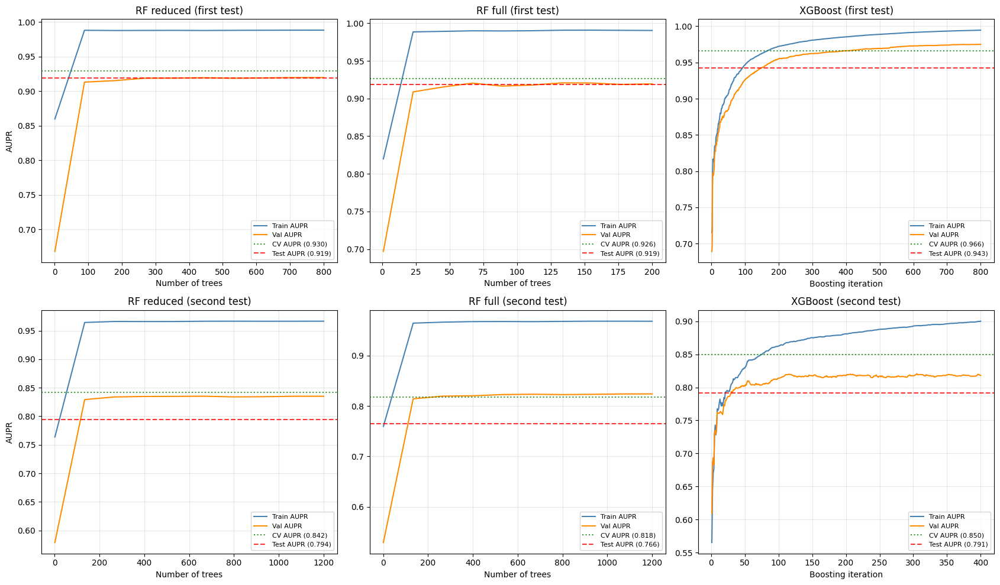

In [97]:
# Compute Test AUPR and recover CV AUPR for each model
test_aupr = {
    'rf_red':       average_precision_score(y_test, rf_red_best.predict_proba(X_test_red)[:, 1]),
    'rf_full':      average_precision_score(y_test, rf_full_best.predict_proba(X_test_raw)[:, 1]),
    'xgb':          average_precision_score(y_test, xgb_best.predict_proba(X_test_red)[:, 1]),
    'rf_red_prod':  average_precision_score(y_test, rf_red_prod_best.predict_proba(X_test_prod_red)[:, 1]),
    'rf_full_prod': average_precision_score(y_test, rf_full_prod_best.predict_proba(X_test_prod)[:, 1]),
    'xgb_prod':     average_precision_score(y_test, xgb_prod_best.predict_proba(X_test_prod_red)[:, 1]),
}
cv_aupr = {
    'rf_red':       grid_red.best_score_,
    'rf_full':      grid_full.best_score_,
    'xgb':          grid_xgb.best_score_,
    'rf_red_prod':  grid_red_prod.best_score_,
    'rf_full_prod': grid_full_prod.best_score_,
    'xgb_prod':     grid_xgb_prod.best_score_,
}

def plot_curve(ax, title, rounds, train, val, cv_val, test_val, xlabel):
    ax.plot(rounds, train, label='Train AUPR', color='steelblue')
    ax.plot(rounds, val,   label='Val AUPR',   color='darkorange')
    ax.axhline(cv_val,   color='green', linestyle=':',  alpha=0.8, label=f'CV AUPR ({cv_val:.3f})')
    ax.axhline(test_val, color='red',   linestyle='--', alpha=0.8, label=f'Test AUPR ({test_val:.3f})')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.3)

fig, axes = plt.subplots(2, 3, figsize=(17, 10))

rounds, tr, vl = rf_learning_curve(rf_red_best, X_train_red, X_val_red, y_train, y_val)
plot_curve(axes[0, 0], 'RF reduced (first test)',  rounds, tr, vl, cv_aupr['rf_red'],  test_aupr['rf_red'],  'Number of trees')
axes[0, 0].set_ylabel('AUPR')

rounds, tr, vl = rf_learning_curve(rf_full_best, X_train_raw, X_val_raw, y_train, y_val)
plot_curve(axes[0, 1], 'RF full (first test)',     rounds, tr, vl, cv_aupr['rf_full'], test_aupr['rf_full'], 'Number of trees')

rounds, tr, vl = xgb_learning_curve(xgb_best, X_train_red, X_val_red, y_train, y_val)
plot_curve(axes[0, 2], 'XGBoost (first test)',     rounds, tr, vl, cv_aupr['xgb'],    test_aupr['xgb'],    'Boosting iteration')

rounds, tr, vl = rf_learning_curve(rf_red_prod_best, X_train_prod_red, X_val_prod_red, y_train, y_val)
plot_curve(axes[1, 0], 'RF reduced (second test)', rounds, tr, vl, cv_aupr['rf_red_prod'],  test_aupr['rf_red_prod'],  'Number of trees')
axes[1, 0].set_ylabel('AUPR')

rounds, tr, vl = rf_learning_curve(rf_full_prod_best, X_train_prod, X_val_prod, y_train, y_val)
plot_curve(axes[1, 1], 'RF full (second test)',    rounds, tr, vl, cv_aupr['rf_full_prod'], test_aupr['rf_full_prod'], 'Number of trees')

rounds, tr, vl = xgb_learning_curve(xgb_prod_best, X_train_prod_red, X_val_prod_red, y_train, y_val)
plot_curve(axes[1, 2], 'XGBoost (second test)',    rounds, tr, vl, cv_aupr['xgb_prod'],     test_aupr['xgb_prod'],     'Boosting iteration')

plt.tight_layout()
plt.show()

First test. The three models reach roughly the same level on Val / CV / Test (around 0.92 for the two RFs, around 0.95 for XGBoost). What I measured on validation is what I get on test. The Train curve is higher than Val (0.99 for RFs, 1 for XGBoost) but that is the natural training-set fit of bagged or boosted trees, not a sign of over-fitting since Val tracks CV and Test.

Second test. The drop in performance shows up on all three models. Val is around 0.82-0.84, and Test is around 0.77-0.79. The gap between Train and Val is wider than in the first test, especially for the two Random Forests. This happens because the engineered ratios have less raw signal than Total_Trans_Ct or Total_Trans_Amt. There is also a small but consistent gap between Val and Test (about 3 to four points of AUPR) that wasn't there in the first test. This gap shows the larger sampling variance that comes with a harder problem. XGBoost performs the best.

## Test set performance overview

A single table with the test set metrics of all six fitted models. For the XGBoost models I reuse the F1-max thresholds already chosen on validation in Step 4 and Step 7. For the four Random Forests, which were never threshold-tuned, I pick the F1-max threshold on validation here. AUPR and ROC AUC are threshold-independent and give the cleanest comparison.

In [98]:
# Reuse thresholds already tuned for the XGBoost models; sweep only for the RFs
models = [
    ('RF reduced (first test)',  rf_red_best,       X_val_red,         X_test_red,      None),
    ('RF full (first test)',     rf_full_best,      X_val_raw,         X_test_raw,      None),
    ('XGBoost (first test)',     xgb_best,          X_val_red,         X_test_red,      best_threshold),
    ('RF reduced (second test)', rf_red_prod_best,  X_val_prod_red,    X_test_prod_red, None),
    ('RF full (second test)',    rf_full_prod_best, X_val_prod,        X_test_prod,     None),
    ('XGBoost (second test)',    xgb_prod_best,     X_val_prod_red,    X_test_prod_red, best_threshold_prod),
]

rows = []
for name, model, X_val_m, X_test_m, fixed_t in models:
    proba_val  = model.predict_proba(X_val_m)[:, 1]
    proba_test = model.predict_proba(X_test_m)[:, 1]
    if fixed_t is None:
        # RF: pick F1-max threshold on validation (same step 0.05 used everywhere else)
        best_t = max(np.arange(0.05, 1.0, 0.05),
                     key=lambda t: f1_score(y_val, (proba_val > t).astype(int), zero_division=0))
    else:
        best_t = fixed_t
    y_pred = (proba_test > best_t).astype(int)
    rows.append({
        'Model': name,
        'F1 threshold': round(best_t, 2),
        'Accuracy':  accuracy_score(y_test, y_pred),
        'Recall':    recall_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'F1':        f1_score(y_test, y_pred),
        'ROC AUC':   roc_auc_score(y_test, proba_test),
        'AUPR':      average_precision_score(y_test, proba_test),
    })

test_summary = pd.DataFrame(rows).set_index('Model').round(4)
test_summary

,F1 threshold,Accuracy,Recall,Precision,F1,ROC AUC,AUPR
Model,,,,,,,
RF reduced (first test),0.45,0.9395,0.8893,0.7695,0.8251,0.9807,0.9191
RF full (first test),0.50,0.9428,0.8607,0.7985,0.8284,0.9803,0.9186
XGBoost (first test),0.65,0.9638,0.8852,0.8889,0.8871,0.9895,0.9427
RF reduced (second test),0.45,0.9033,0.8156,0.6611,0.7303,0.9488,0.7945
RF full (second test),0.50,0.8980,0.7131,0.6718,0.6918,0.9410,0.7655
XGBoost (second test),0.70,0.9099,0.7623,0.7019,0.7308,0.9482,0.7912


## Feature importance of the second-test XGBoost

A quick look at the built-in importance of the operational model, to see which features drive its predictions.

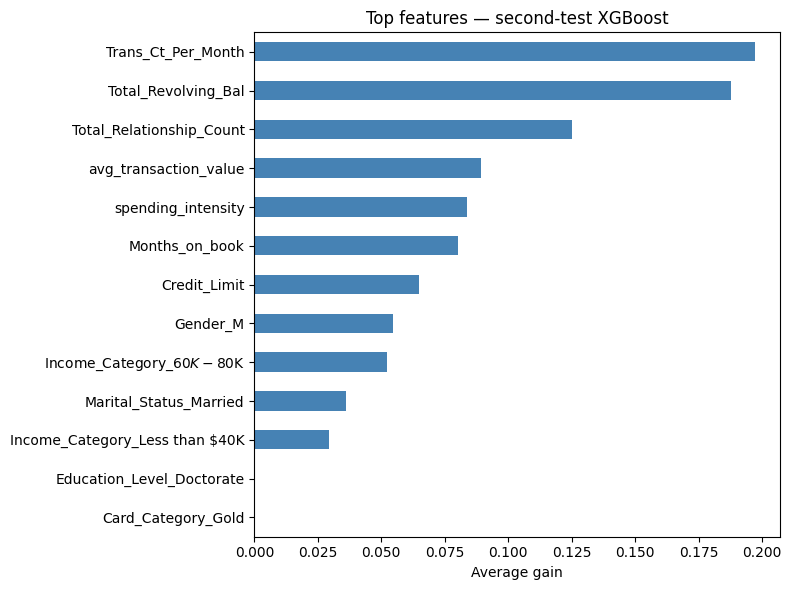

In [99]:
xgb_prod_imp = pd.Series(xgb_prod_best.feature_importances_, index=X_train_prod_red.columns)
xgb_prod_imp = xgb_prod_imp.sort_values(ascending=True)

plt.figure(figsize=(8, 6))
xgb_prod_imp.tail(15).plot.barh(color='steelblue')
plt.xlabel('Average gain')
plt.title('Top features — second-test XGBoost')
plt.tight_layout()
plt.show()

The three engineered ratios (Trans_Ct_Per_Month, spending_intensity, avg_transaction_value) dominate the ranking, alongside Total_Revolving_Bal and Total_Relationship_Count. The model relies essentially on the features I built to compensate for the removal of Total_Trans_Ct and Total_Trans_Amt. It confirms the feature engineering recovered most of the predictive signal.

# Conclusion

I tested three models (Lasso + RF reduced, RF full, and XGBoost) on 10,127 customers. I did this twice: first using all data, and then using a cleaner dataset that avoids data leakage by including three new engineered ratios. XGBoost performed the best in both tests.

First XGBoost (All data): AUPR of 0.943 and an expected profit of around $41,500.

Second XGBoost (Clean data): AUPR of 0.79 and an expected profit of around $32,750.

Switching to the clean dataset causes a 21% drop in profit. This is the price I pay for using features that can be safely updated on a rolling schedule.

I recommend deploying the second XGBoost for the monthly retention campaign and keeping the first XGBoost as an internal benchmark to measure performance. Furthermore, all feature importance methods point to the same top features.